# Data Collection & Exploration

The data is collected from Statistics Canada. Statistics Canada. Table 24-10-0057-01  **Leading indicator, International visitors entering or returning to Canada by land, by vehicle type, vehicle licence plate and traveller type.** https://www150.statcan.gc.ca/t1/tbl1/en/tv.action?pid=2410005701

Title: Leading indicator, International visitors entering or returning to Canada by land, by vehicle type, vehicle licence plate and traveller type

Frequency: Daily

Table: 24-10-0057-01

Release date: 2025-04-10

Geography: Canada, Provience or territory

## Exploratory Data Analysis

In [51]:
# Importing necessary libraries for Reading Data And EDA
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
%matplotlib inline
import plotly.graph_objects as go

In [52]:
# Reading the file and printing
vehicles_entering_raw = pd.read_csv("/content/Visitors_Entering_Canada_By_Road_20250319.csv")
print(vehicles_entering_raw)

     Reference period  Automobiles  Motorcycles  Other land vehicles   Total
0          01-01-2017       103844           11                    0  103855
1          02-01-2017       130736           35                    0  130771
2          03-01-2017        84231            9                    0   84240
3          04-01-2017        79621           20                    0   79641
4          05-01-2017        84516           18                    0   84534
...               ...          ...          ...                  ...     ...
2976       24-02-2025        51408           19                   39   51466
2977       25-02-2025        46256           11                   48   46315
2978       26-02-2025        48990           16                   29   49035
2979       27-02-2025        55153            9                   41   55203
2980       28-02-2025        77573           27                   33   77633

[2981 rows x 5 columns]


In [53]:
#Rename columns replacing spaces with underscores
vehicles_entering_raw.columns = [col.replace(' ', '_') for col in vehicles_entering_raw.columns]
print(vehicles_entering_raw.columns)

Index(['Reference_period', 'Automobiles', 'Motorcycles', 'Other_land_vehicles',
       'Total'],
      dtype='object')


In [54]:
vehicles_entering_raw = vehicles_entering_raw.drop(columns=['Automobiles', 'Motorcycles', 'Other_land_vehicles'], axis=1)
vehicles_entering_raw.head()

,Reference_period,Total
0,01-01-2017,103855
1,02-01-2017,130771
2,03-01-2017,84240
3,04-01-2017,79641
4,05-01-2017,84534


In [55]:
# Checking Data Types
print(vehicles_entering_raw.dtypes)

# Convert 'Reference_period' to datetime objects
vehicles_entering_raw['Reference_period'] = pd.to_datetime(vehicles_entering_raw['Reference_period'], format='%d-%m-%Y')
print(vehicles_entering_raw.dtypes)

Reference_period    object
Total                int64
dtype: object
Reference_period    datetime64[ns]
Total                        int64
dtype: object


In [56]:
# Setting Index
vehicles_entering = vehicles_entering_raw.copy()
vehicles_entering['Reference_Period'] = vehicles_entering['Reference_period']
vehicles_entering = vehicles_entering.set_index('Reference_Period')
print(vehicles_entering.head())

                 Reference_period   Total
Reference_Period                         
2017-01-01             2017-01-01  103855
2017-01-02             2017-01-02  130771
2017-01-03             2017-01-03   84240
2017-01-04             2017-01-04   79641
2017-01-05             2017-01-05   84534


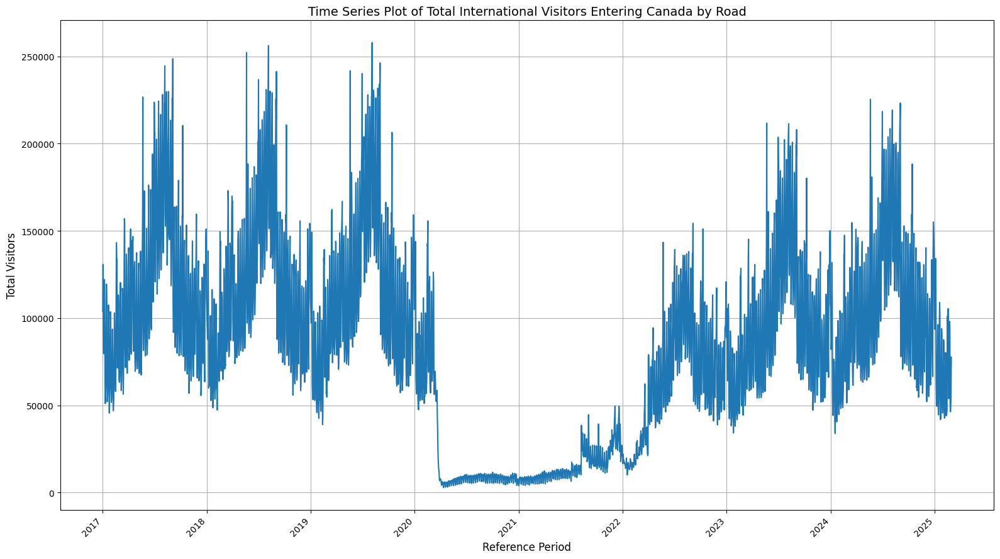

In [57]:
# Plot of Total Vehicals
plt.figure(figsize=(16, 9))
plt.plot(vehicles_entering_raw['Reference_period'], vehicles_entering_raw['Total'], linestyle='-')
plt.title('Time Series Plot of Total International Visitors Entering Canada by Road', fontsize=14)
plt.xlabel('Reference Period', fontsize=12)
plt.ylabel('Total Visitors', fontsize=12)
plt.grid(True)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [58]:
# Interactive Graph
fig = px.line(vehicles_entering_raw, x='Reference_period', y='Total',
              title='Time Series Plot of Total International Visitors Entering Canada by Road')
fig.update_xaxes(title_text='Reference_Period')
fig.update_yaxes(title_text='Total Visitors')
fig.show()

In [59]:
# Plots for the last 5 years, 3 years, and 1 year
last_date = vehicles_entering['Reference_period'].max()

five_years_ago = last_date - pd.DateOffset(years=5)
fig = px.line(vehicles_entering[vehicles_entering['Reference_period'] >= five_years_ago],
              x='Reference_period', y='Total', title='Last 5 Years')
fig.show()

three_years_ago = last_date - pd.DateOffset(years=3)
fig = px.line(vehicles_entering[vehicles_entering['Reference_period'] >= three_years_ago],
              x='Reference_period', y='Total', title='Last 3 Years')
fig.show()

one_year_ago = last_date - pd.DateOffset(years=1)
fig = px.line(vehicles_entering[vehicles_entering['Reference_period'] >= one_year_ago],
              x='Reference_period', y='Total', title='Last 1 Year')
fig.show()

In [60]:
# Checking for missing values and outliers
print(vehicles_entering.isnull().sum())

Q1 = vehicles_entering['Total'].quantile(0.25)
Q3 = vehicles_entering['Total'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = vehicles_entering[(vehicles_entering['Total'] < lower_bound) | (vehicles_entering['Total'] > upper_bound)]
num_outliers = len(outliers)

print(f"Number of outliers: {num_outliers}")
print("Outliers:")
for index, row in outliers.iterrows():
    print(f"Index: {index}, Value: {row['Total']}")

Reference_period    0
Total               0
dtype: int64
Number of outliers: 9
Outliers:
Index: 2017-08-07 00:00:00, Value: 244582
Index: 2017-09-04 00:00:00, Value: 248656
Index: 2018-05-21 00:00:00, Value: 252113
Index: 2018-08-06 00:00:00, Value: 256203
Index: 2018-09-03 00:00:00, Value: 241349
Index: 2019-05-20 00:00:00, Value: 241768
Index: 2019-07-01 00:00:00, Value: 240150
Index: 2019-08-05 00:00:00, Value: 257908
Index: 2019-09-02 00:00:00, Value: 246283


The data contains no missing values and 9 outliers. As the data is autentatic, we are keeping the outliers in data.

In [61]:
# Trends in data
vehicles_entering['Year'] = vehicles_entering['Reference_period'].dt.year
vehicles_entering['Month'] = vehicles_entering['Reference_period'].dt.month
vehicles_entering['Quarter'] = vehicles_entering['Reference_period'].dt.quarter
vehicles_entering['Week'] = vehicles_entering['Reference_period'].dt.isocalendar().week

# Yearly Trend
yearly_trend = vehicles_entering.groupby('Year')['Total'].sum().reset_index()
fig_yearly = px.line(yearly_trend, x='Year', y='Total', title='Yearly Trend')
fig_yearly.show()

# Quarterly Trend
quarterly_trend = vehicles_entering.groupby(['Year', 'Quarter'])['Total'].sum().reset_index()
fig_quarterly = px.line(quarterly_trend, x='Quarter', y='Total', color='Year', title='Quarterly Trend')
fig_quarterly.show()

# Monthly Trend
monthly_trend = vehicles_entering.groupby(['Year', 'Month'])['Total'].sum().reset_index()
fig_monthly = px.line(monthly_trend, x='Month', y='Total', color='Year', title='Monthly Trend')
fig_monthly.show()

# Weekly Trend
weekly_trend = vehicles_entering.groupby(['Year', 'Week'])['Total'].sum().reset_index()
fig_weekly = px.line(weekly_trend, x='Week', y='Total', color='Year', title='Weekly Trend')
fig_weekly.show()

In [62]:
# Rooling Average 7
fig = go.Figure()
fig.add_trace(go.Scatter(x=vehicles_entering['Reference_period'], y=vehicles_entering['Total'], mode='lines', name='Original Data'))

# Calculate rolling mean (e.g., 7-day rolling mean)
rolling_mean = vehicles_entering['Total'].rolling(window=7).mean()
fig.add_trace(go.Scatter(x=vehicles_entering['Reference_period'], y=rolling_mean, mode='lines', name='7-Day Rolling Mean'))
fig.update_layout(title='Trend Analysis with Rolling Mean', xaxis_title='Reference Period', yaxis_title='Total Visitors')
fig.show()

# For the last 5 years:
five_years_ago = last_date - pd.DateOffset(years=5)
last_five_years_data = vehicles_entering[vehicles_entering['Reference_period'] >= five_years_ago]
fig = go.Figure()
fig.add_trace(go.Scatter(x=last_five_years_data['Reference_period'], y=last_five_years_data['Total'], mode='lines', name='Original Data'))
rolling_mean_5yr = last_five_years_data['Total'].rolling(window=7).mean()
fig.add_trace(go.Scatter(x=last_five_years_data['Reference_period'], y=rolling_mean_5yr, mode='lines', name='7-Day Rolling Mean'))
fig.update_layout(title='Trend Analysis (Last 5 Years)', xaxis_title='Reference Period', yaxis_title='Total Visitors')
fig.show()

# For the last 3 years:
three_years_ago = last_date - pd.DateOffset(years=3)
last_three_years_data = vehicles_entering[vehicles_entering['Reference_period'] >= three_years_ago]
fig = go.Figure()
fig.add_trace(go.Scatter(x=last_three_years_data['Reference_period'], y=last_three_years_data['Total'], mode='lines', name='Original Data'))
rolling_mean_5yr = last_three_years_data['Total'].rolling(window=7).mean()
fig.add_trace(go.Scatter(x=last_three_years_data['Reference_period'], y=rolling_mean_5yr, mode='lines', name='7-Day Rolling Mean'))
fig.update_layout(title='Trend Analysis (Last 3 Years)', xaxis_title='Reference Period', yaxis_title='Total Visitors')
fig.show()

In [63]:
# Stationary Test
from statsmodels.tsa.stattools import adfuller

def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
       dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)

# ADF Test for the whole dataset
print("\nTotal")
adf_test(vehicles_entering['Total'])

# ADF Test for the last 5 years
print("\nLast 5 Years")
adf_test(last_five_years_data['Total'])

# ADF Test for the last 3 years
print("\nLast 3 Years")
adf_test(last_three_years_data['Total'])


Total
Results of Dickey-Fuller Test:
Test Statistic                   -2.435497
p-value                           0.131967
#Lags Used                       29.000000
Number of Observations Used    2951.000000
Critical Value (1%)              -3.432568
Critical Value (5%)              -2.862520
Critical Value (10%)             -2.567292
dtype: float64

Last 5 Years
Results of Dickey-Fuller Test:
Test Statistic                   -1.803226
p-value                           0.378861
#Lags Used                       22.000000
Number of Observations Used    1805.000000
Critical Value (1%)              -3.433978
Critical Value (5%)              -2.863143
Critical Value (10%)             -2.567623
dtype: float64

Last 3 Years
Results of Dickey-Fuller Test:
Test Statistic                   -2.948934
p-value                           0.039946
#Lags Used                       22.000000
Number of Observations Used    1074.000000
Critical Value (1%)              -3.436453
Critical Value (5%)      

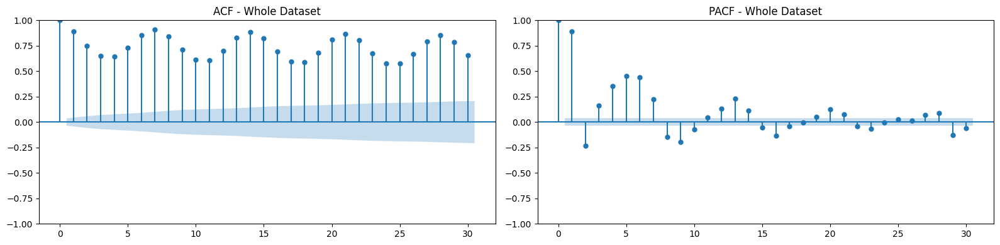

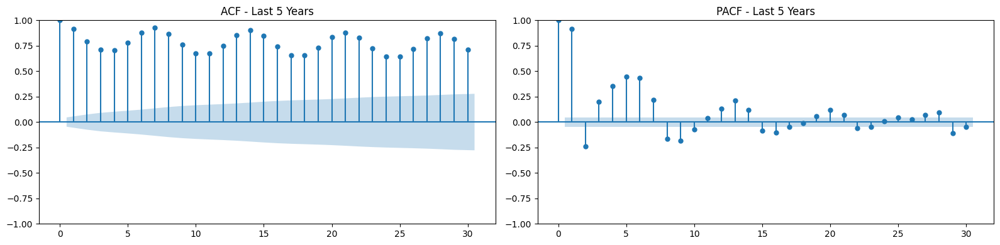

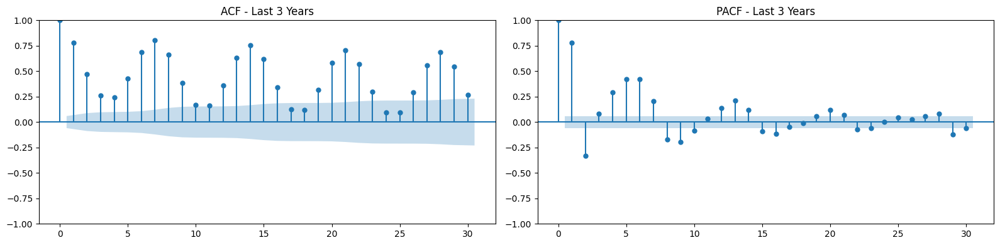

In [64]:
# ACT and PCT Plots
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

def plot_acf_pacf(data, title):
    fig, axes = plt.subplots(1, 2, figsize=(16, 4))
    plot_acf(data, ax=axes[0], lags=30)
    axes[0].set_title(f'ACF - {title}')
    plot_pacf(data, ax=axes[1], lags=30)
    axes[1].set_title(f'PACF - {title}')
    plt.tight_layout()
    plt.show()

# Whole dataset
plot_acf_pacf(vehicles_entering['Total'], 'Whole Dataset')

# Last 5 years
plot_acf_pacf(last_five_years_data['Total'], 'Last 5 Years')

# Last 3 years
plot_acf_pacf(last_three_years_data['Total'], 'Last 3 Years')

The p value for the whole data and last 5 years in greater than 0.05 (non-stationary data) indicating there is a need for differencing. For last 3 years as the p value is below 0.05 (stationary data) there is no need to differenciate.

In [65]:
# Differencing
# If the time series data exhibits a trend or seasonality, differencing can be applied to make it stationary.
# Differencing involves subtracting consecutive data points to remove trends.
# The order of differencing (d) is determined by how many times you need to difference the data to achieve stationarity.

# Smoothing
# Smoothing techniques aim to reduce noise and highlight underlying trends in the data.
# Common smoothing methods include moving averages, exponential smoothing, and more complex methods like ARIMA.
# Smoothing is often applied before differencing to create a smoother time series for differencing.

# How to decide:
# 1. Visual Inspection: Plotting the data, its ACF (Autocorrelation Function), and PACF (Partial Autocorrelation Function) plots can give you initial insights.
# A clear trend or seasonality in the plot suggests differencing.  A significant spike at lag 1 in the ACF and PACF suggests differencing might be needed.  A slowly decaying ACF suggests that differencing might be beneficial.
# High volatility or noise indicates that smoothing might help.

# 2. Augmented Dickey-Fuller Test: Use the ADF test (as you've done in your code).
# A low p-value (typically below 0.05) indicates stationarity, meaning you likely don't need to difference.
# A high p-value suggests non-stationarity, meaning that differencing might be required.

# 3. ACF and PACF plots: The ACF shows the correlation between a time series and its lagged values. The PACF shows the partial correlation between a time series and its lagged values, controlling for the intermediate lags.

In [66]:
# Create a plot to display seasons and important date
fig = go.Figure()

# Plot the main time series line
fig.add_trace(go.Scatter(
    x=vehicles_entering['Reference_period'],
    y=vehicles_entering['Total'],
    mode='lines',
    name='Total Visitors',
    line=dict(color='blue')
))

# Define seasons and their corresponding background colors
seasons = {
    'Winter': ['12', '01', '02'],
    'Spring': ['03', '04', '05'],
    'Summer': ['06', '07', '08'],
    'Fall': ['09', '10', '11']
}
season_colors = {
    'Winter': 'lightblue',
    'Spring': 'lightpink',
    'Summer': 'lightyellow',
    'Fall': 'lightgrey'
}

# Iterate through seasons and add background shapes for all years
start_year = vehicles_entering['Reference_period'].dt.year.min()
end_year = vehicles_entering['Reference_period'].dt.year.max()

for year in range(start_year, end_year + 1):
    for season, months in seasons.items():
        start_date_str = f"{year}-{months[0]}-01"
        # Find the end of the season
        if months[-1] == '12':
            end_date_str = f"{year}-12-31"
        else:
            next_month = int(months[-1]) + 1
            end_of_month = pd.Timestamp(f"{year}-{next_month:02d}-01") - pd.Timedelta(days=1)
            end_date_str = end_of_month.strftime('%Y-%m-%d')

        fig.add_shape(
            type="rect",
            xref="x",
            yref="paper",
            x0=start_date_str,
            y0=0,
            x1=end_date_str,
            y1=1,
            fillcolor=season_colors[season],
            opacity=0.2,
            layer="below",
            line_width=0,
        )

# Highlight important dates at different levels
important_dates = {
    '2020-03-12': 'COVID-19 Pandemic Declared',
    '2024-11-05': '2024 US Elections',
    '2025-01-20': 'Trump Assumed Office'
}
y_positions = [1, 25000, 1.0]  # Define y-levels, second one is highest
for i, (date_str, event) in enumerate(important_dates.items()):
    date = pd.to_datetime(date_str)  # Convert to Timestamp
    fig.add_vline(
        x=date,
        line_width=2,
        line_dash="dash",
        line_color="red",
    )
    fig.add_annotation(
        x=date,
        y=y_positions[i % len(y_positions)],  # Cycle through y-positions
        text=event,
        showarrow=False,
        font=dict(color="red"),
    )

# Update layout and display the plot
fig.update_layout(
    title='Time Series Plot of Total International Visitors Entering Canada by Road',
    xaxis_title='Reference Period',
    yaxis_title='Total Visitors',
    hovermode="x unified",
    shapes=[]  # It's better to define shapes directly using fig.add_shape
)
fig.show()


*   2020 as a result of the pandemic. Recovery trends could appear in later years as restrictions eased and economies rebounded.
*   By 2024, expect a potential fluctuation in trends, reflecting election-related uncertainties and policy changes.
*  Post-January 2025, any trade policy shifts under new leadership could lead to sudden spikes or drops, depending on the nature of tariffs or incentives implemented.

# Time Series Decomposition

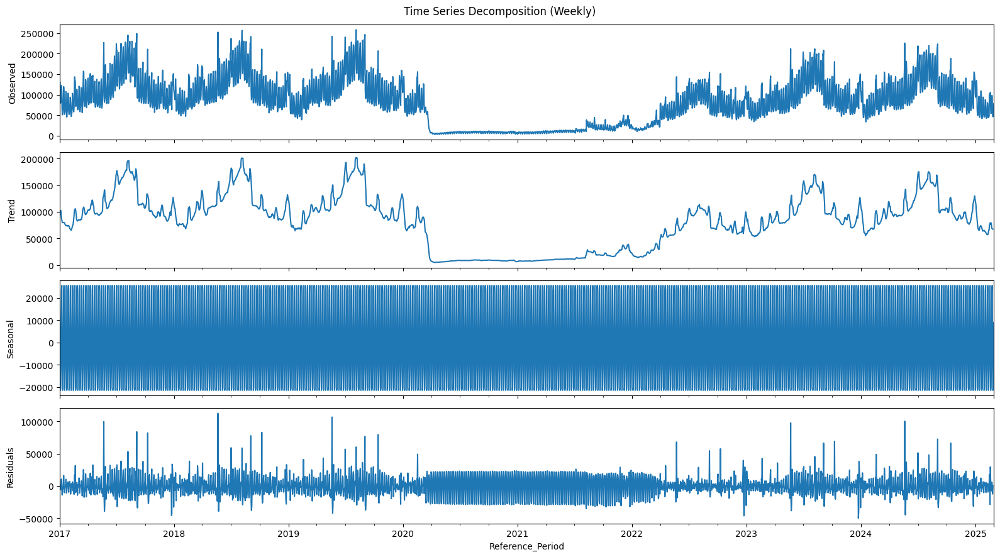

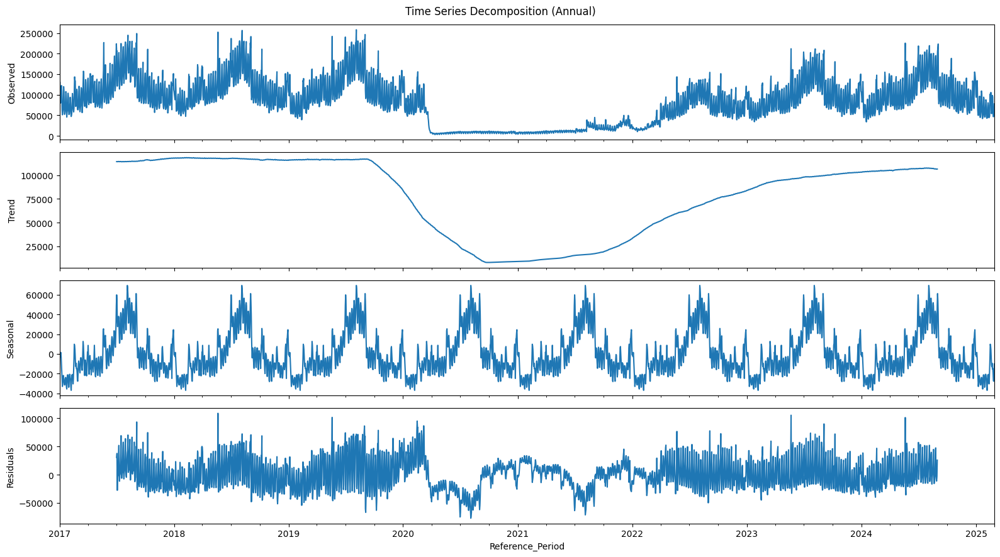

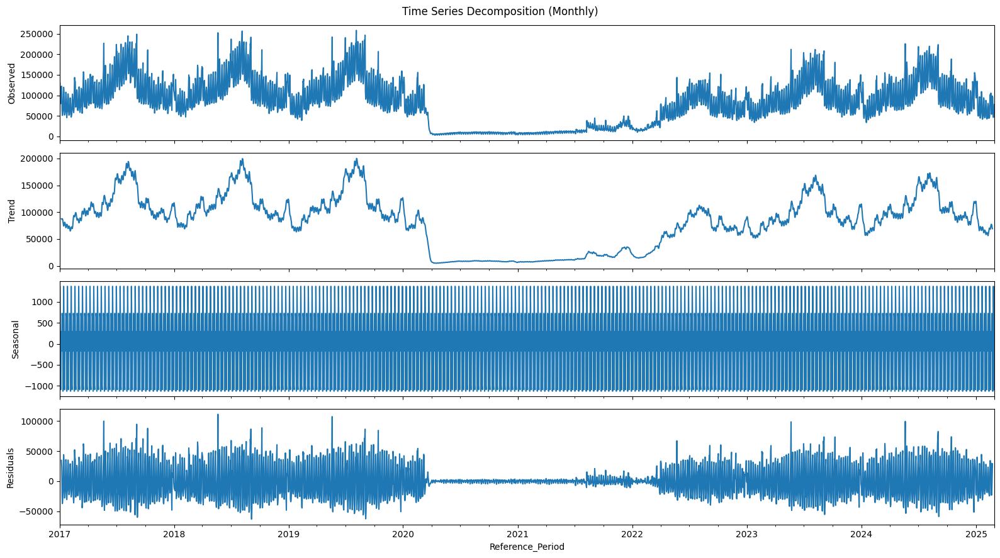

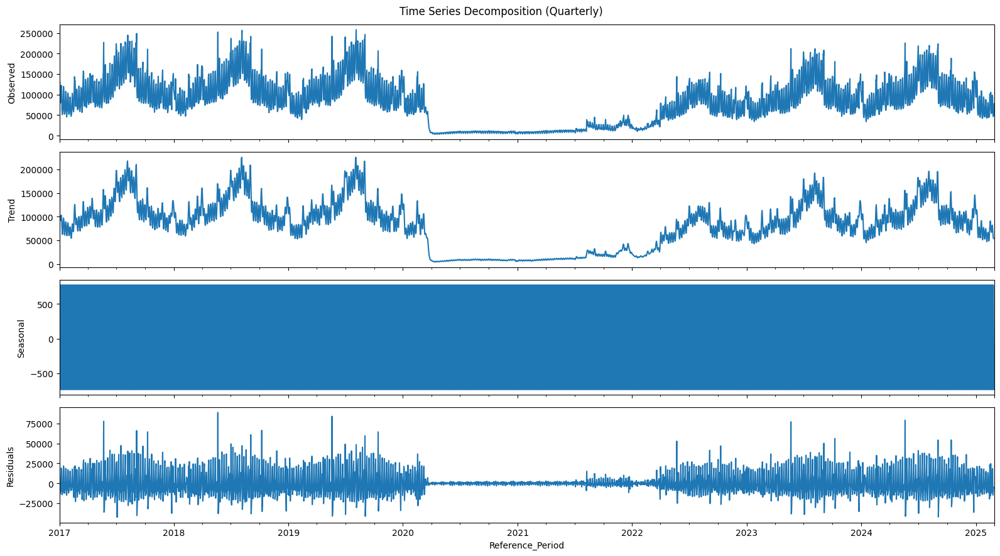

In [67]:
# Seasonal Decomposition (Additive)
from statsmodels.tsa.seasonal import seasonal_decompose

# Decompose the time series for different periods
periods = {'weekly': 7, 'annual': 365, 'monthly': 12, 'quarterly': 4}
decompositions = {}

for name, period in periods.items():
  decompositions[name] = seasonal_decompose(vehicles_entering['Total'], model='additive', period=period)

# Plotting the decomposed components
for name, decomposition in decompositions.items():
    fig, axes = plt.subplots(4, 1, sharex=True, figsize=(16, 9))
    decomposition.observed.plot(ax=axes[0], legend=False)
    axes[0].set_ylabel('Observed')
    decomposition.trend.plot(ax=axes[1], legend=False)
    axes[1].set_ylabel('Trend')
    decomposition.seasonal.plot(ax=axes[2], legend=False)
    axes[2].set_ylabel('Seasonal')
    decomposition.resid.plot(ax=axes[3], legend=False)
    axes[3].set_ylabel('Residuals')
    fig.suptitle(f'Time Series Decomposition ({name.capitalize()})')
    plt.tight_layout()
    plt.show()

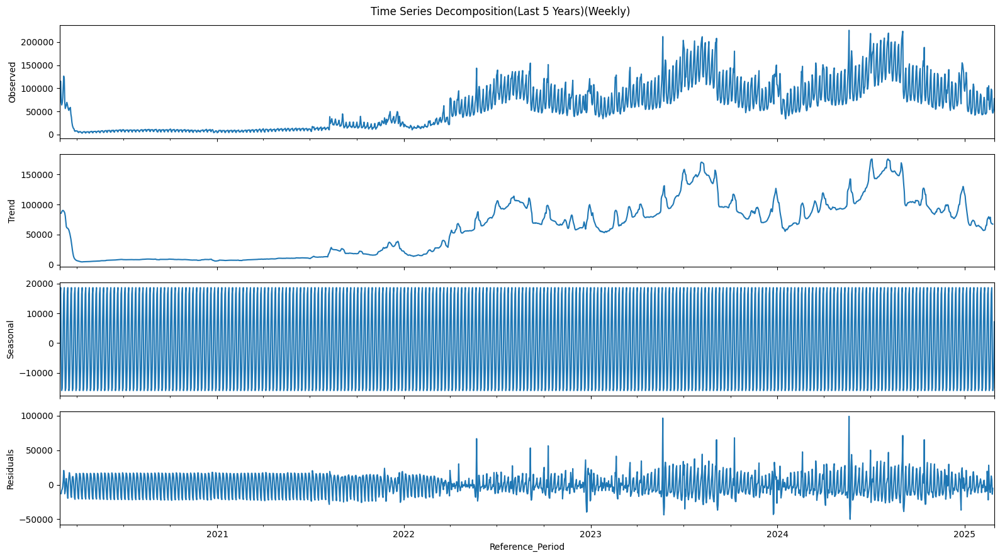

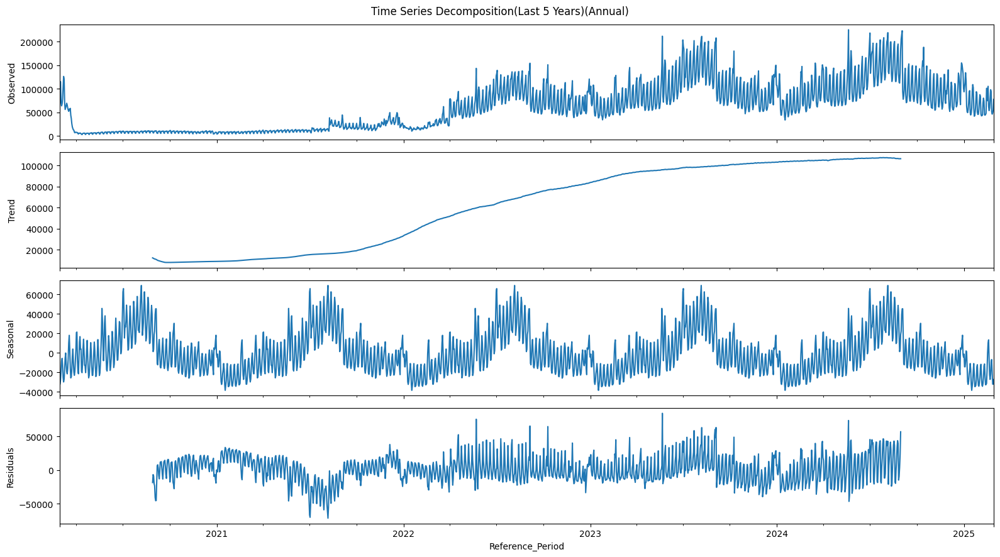

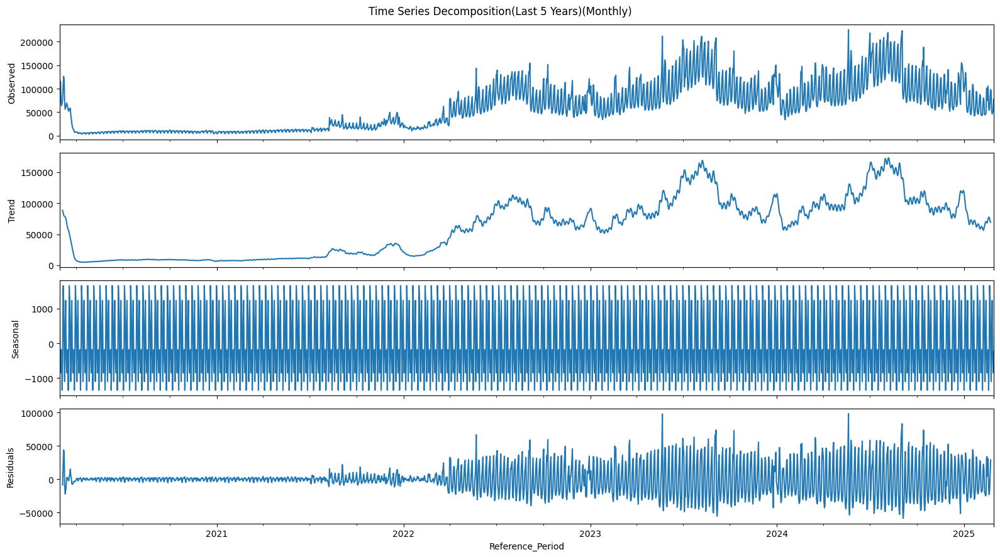

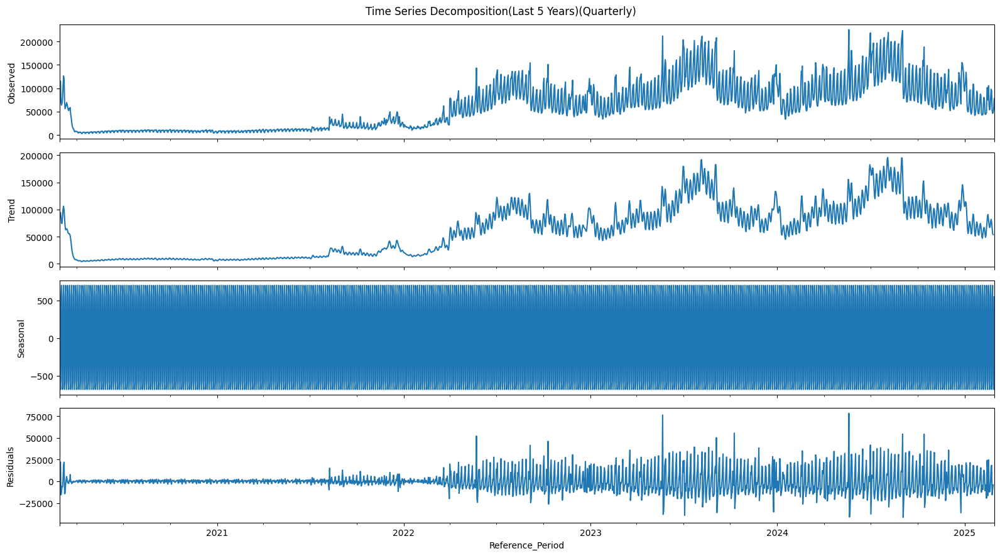

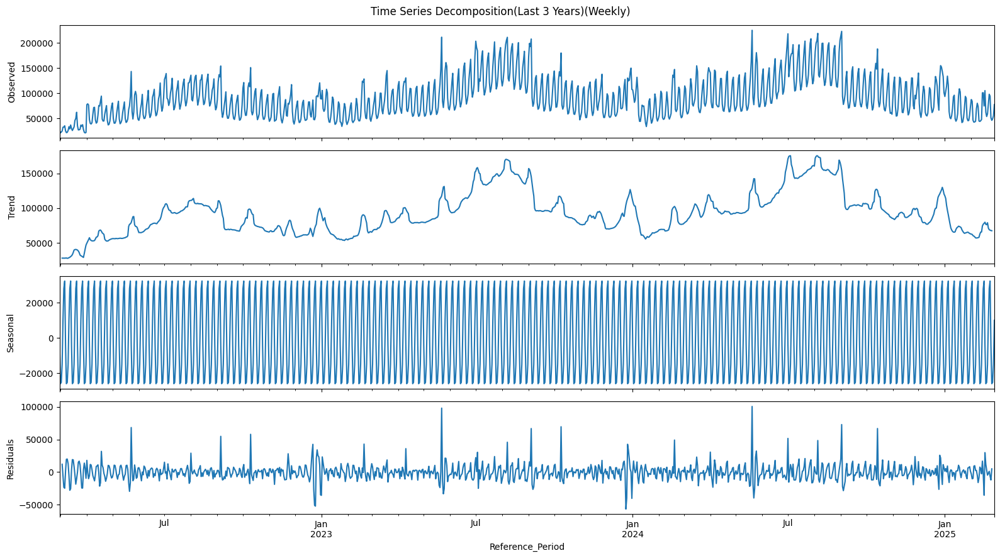

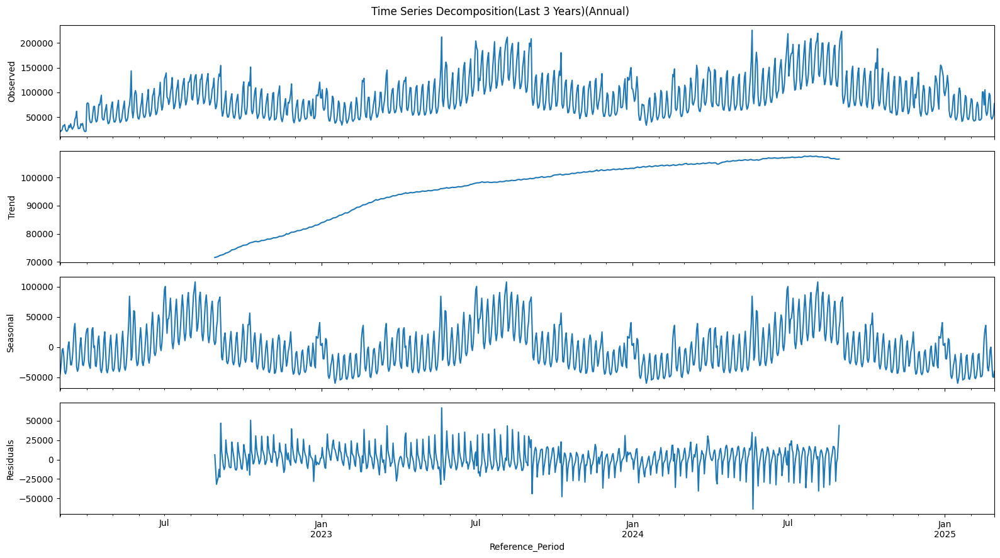

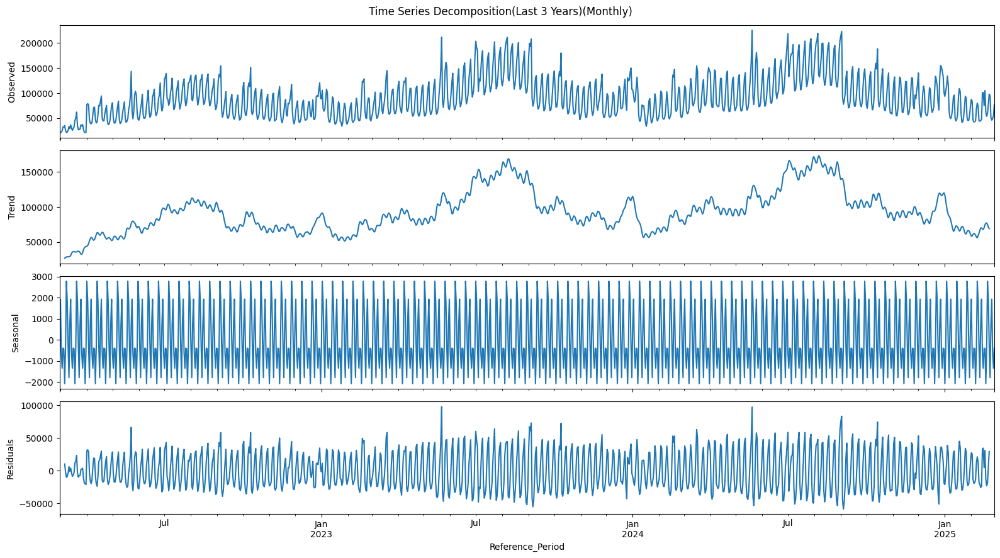

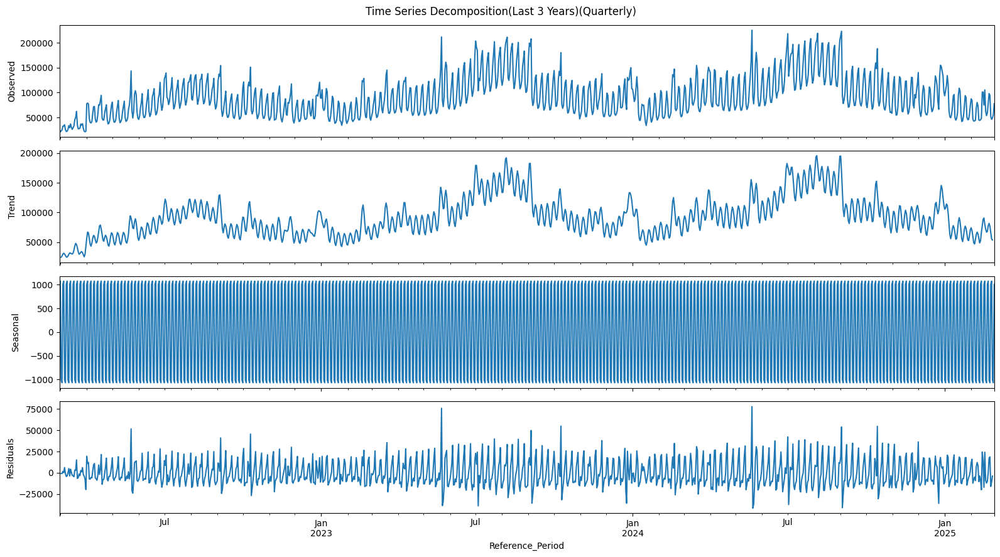

In [68]:
# Seasonal Decomposition for last 5 years (Additive)
decomposition_5yr = {}

for name, period in periods.items():
  decomposition_5yr[name] = seasonal_decompose(last_five_years_data['Total'], model='additive', period=period)

# Plotting the decomposed components
for name, decomposition in decomposition_5yr.items():
    fig, axes = plt.subplots(4, 1, sharex=True, figsize=(16, 9))
    decomposition.observed.plot(ax=axes[0], legend=False)
    axes[0].set_ylabel('Observed')
    decomposition.trend.plot(ax=axes[1], legend=False)
    axes[1].set_ylabel('Trend')
    decomposition.seasonal.plot(ax=axes[2], legend=False)
    axes[2].set_ylabel('Seasonal')
    decomposition.resid.plot(ax=axes[3], legend=False)
    axes[3].set_ylabel('Residuals')
    fig.suptitle(f'Time Series Decomposition(Last 5 Years)({name.capitalize()})')
    plt.tight_layout()
    plt.show()

# Seasonal Decomposition for last 3 years (Additive)
decomposition_3yr = {}

for name, period in periods.items():
  decomposition_3yr[name] = seasonal_decompose(last_three_years_data['Total'], model='additive', period=period)

# Plotting the decomposed components
for name, decomposition in decomposition_3yr.items():
    fig, axes = plt.subplots(4, 1, sharex=True, figsize=(16, 9))
    decomposition.observed.plot(ax=axes[0], legend=False)
    axes[0].set_ylabel('Observed')
    decomposition.trend.plot(ax=axes[1], legend=False)
    axes[1].set_ylabel('Trend')
    decomposition.seasonal.plot(ax=axes[2], legend=False)
    axes[2].set_ylabel('Seasonal')
    decomposition.resid.plot(ax=axes[3], legend=False)
    axes[3].set_ylabel('Residuals')
    fig.suptitle(f'Time Series Decomposition(Last 3 Years)({name.capitalize()})')
    plt.tight_layout()
    plt.show()

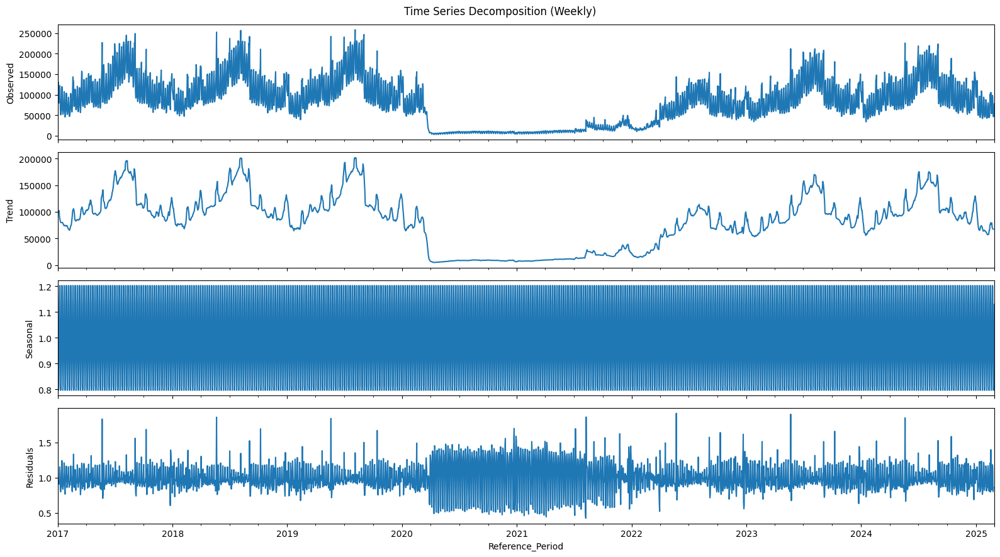

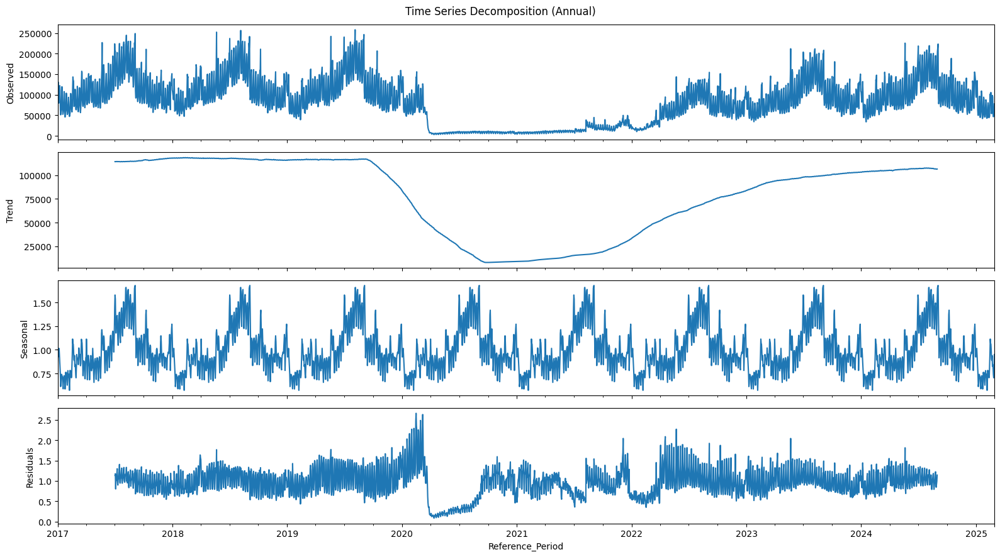

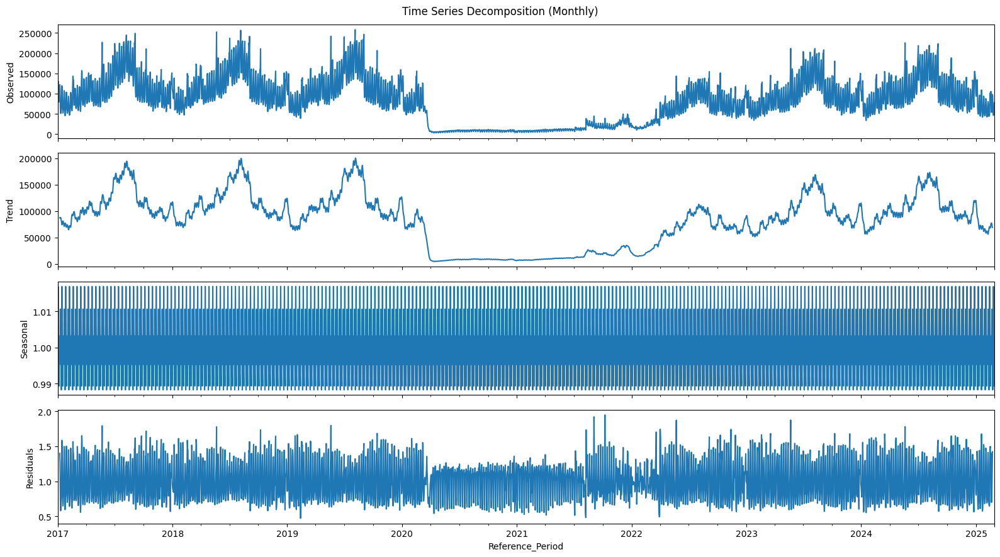

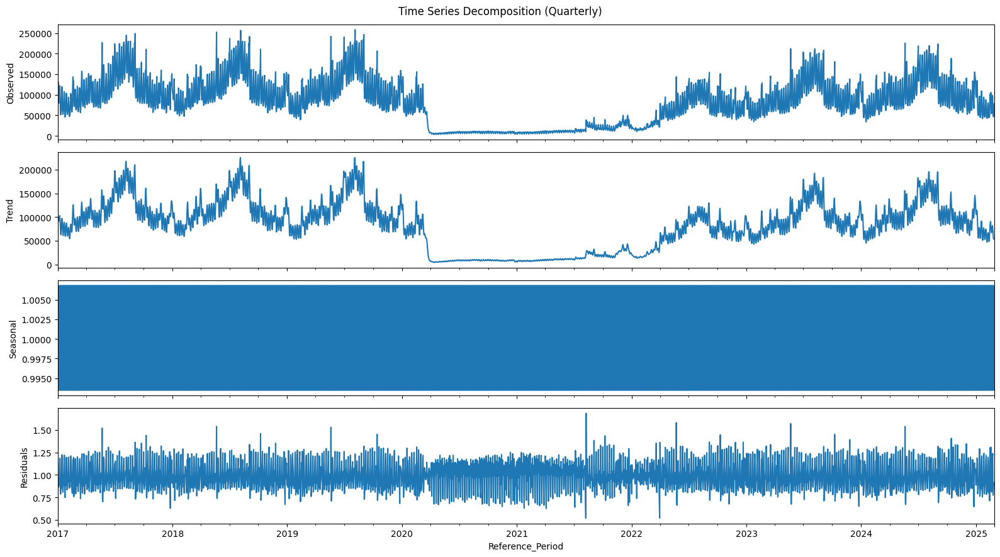

In [69]:
# Seasonal Decomposition (Multiplicative)
# Decompose the time series for different periods
periods = {'weekly': 7, 'annual': 365, 'monthly': 12, 'quarterly': 4}
decompositions = {}

for name, period in periods.items():
  decompositions[name] = seasonal_decompose(vehicles_entering['Total'], model='multiplicative', period=period)

# Plotting the decomposed components
for name, decomposition in decompositions.items():
    fig, axes = plt.subplots(4, 1, sharex=True, figsize=(16, 9))
    decomposition.observed.plot(ax=axes[0], legend=False)
    axes[0].set_ylabel('Observed')
    decomposition.trend.plot(ax=axes[1], legend=False)
    axes[1].set_ylabel('Trend')
    decomposition.seasonal.plot(ax=axes[2], legend=False)
    axes[2].set_ylabel('Seasonal')
    decomposition.resid.plot(ax=axes[3], legend=False)
    axes[3].set_ylabel('Residuals')
    fig.suptitle(f'Time Series Decomposition ({name.capitalize()})')
    plt.tight_layout()
    plt.show()

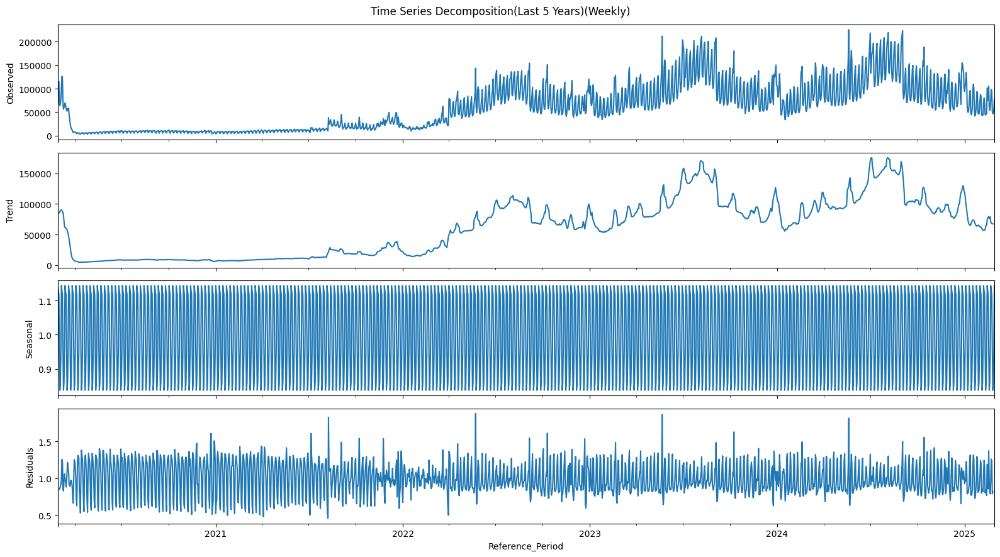

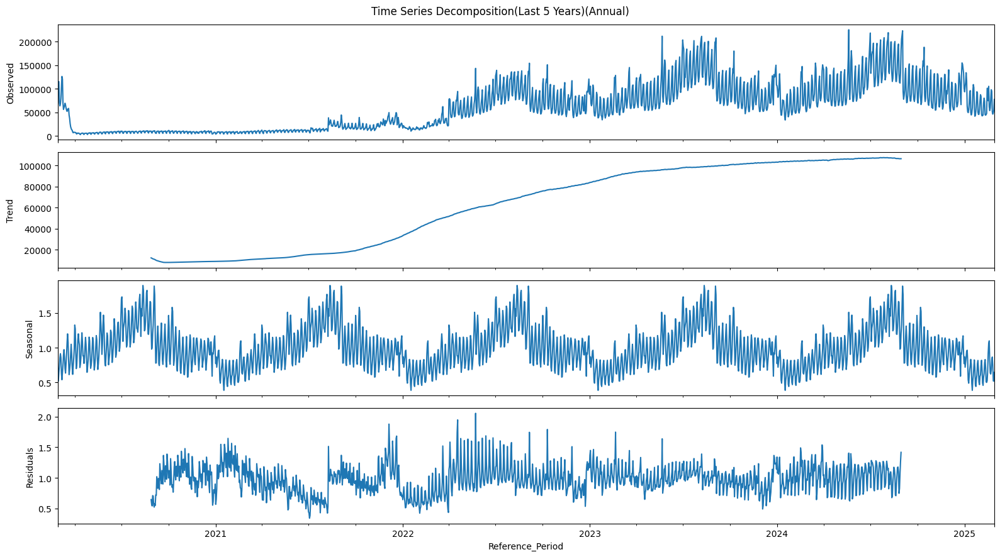

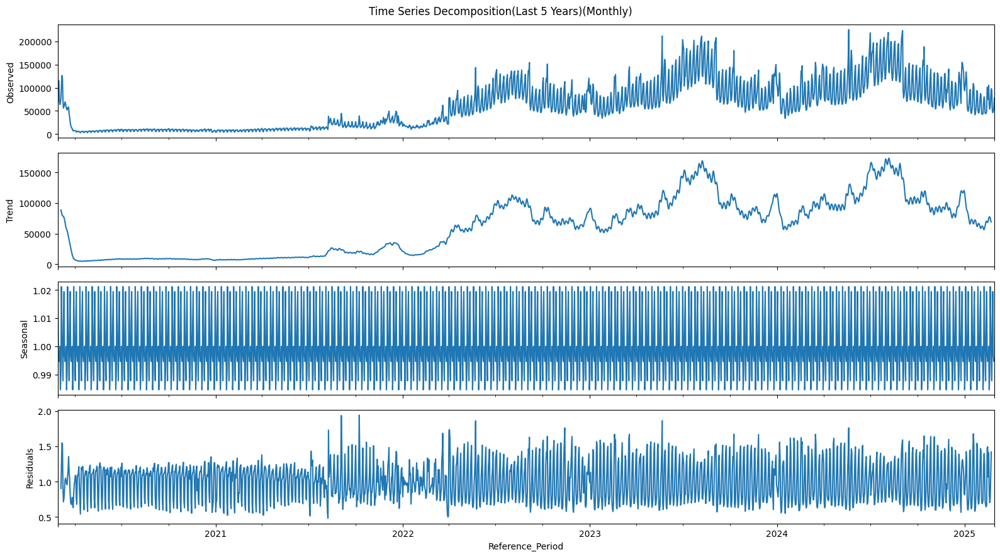

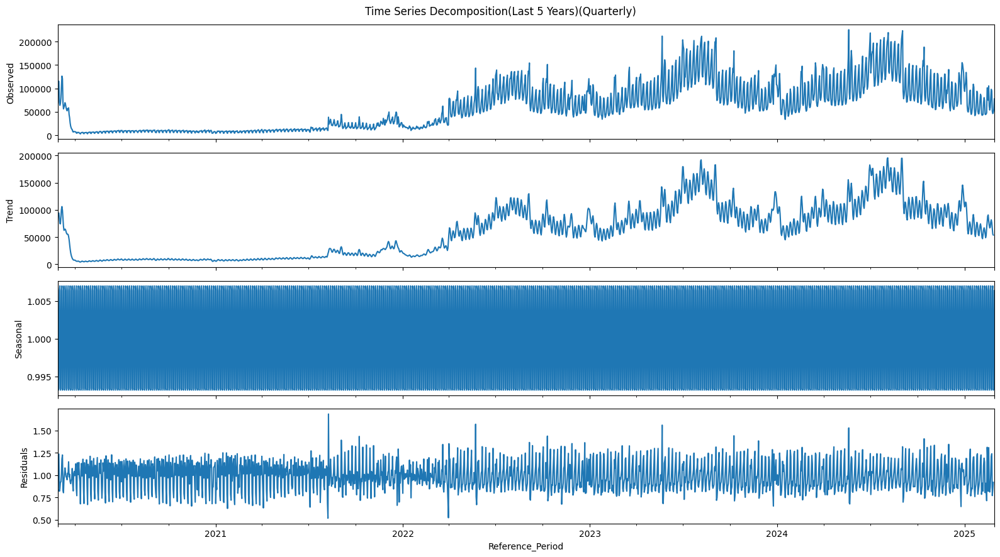

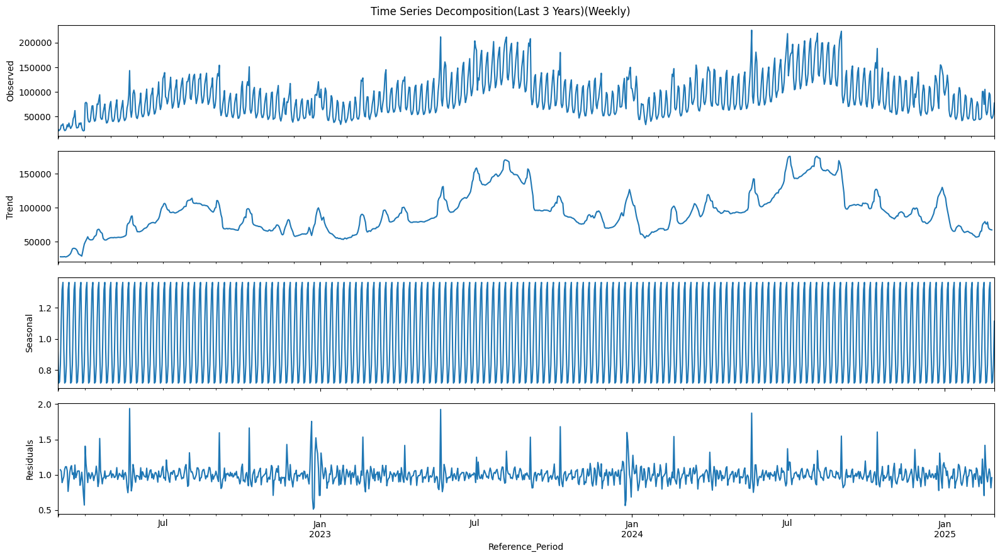

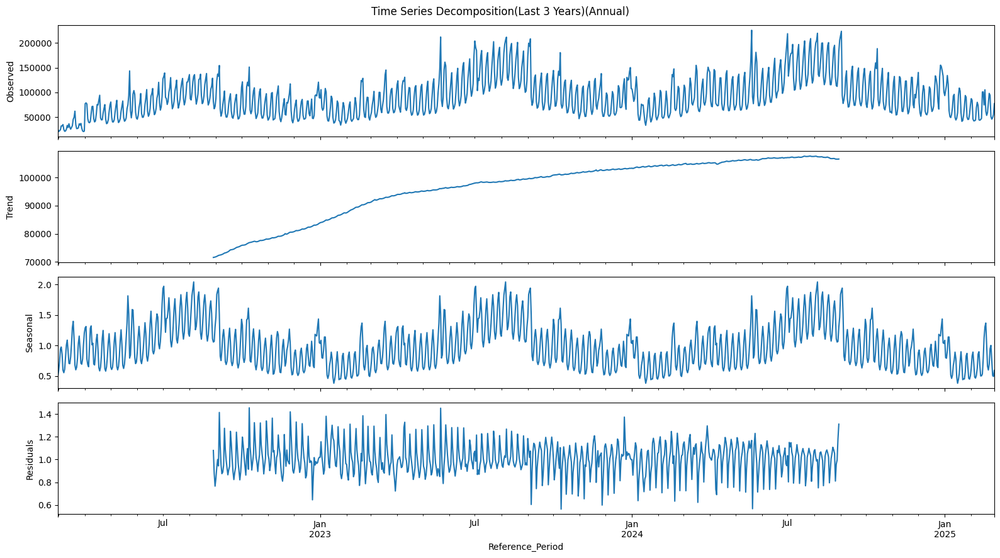

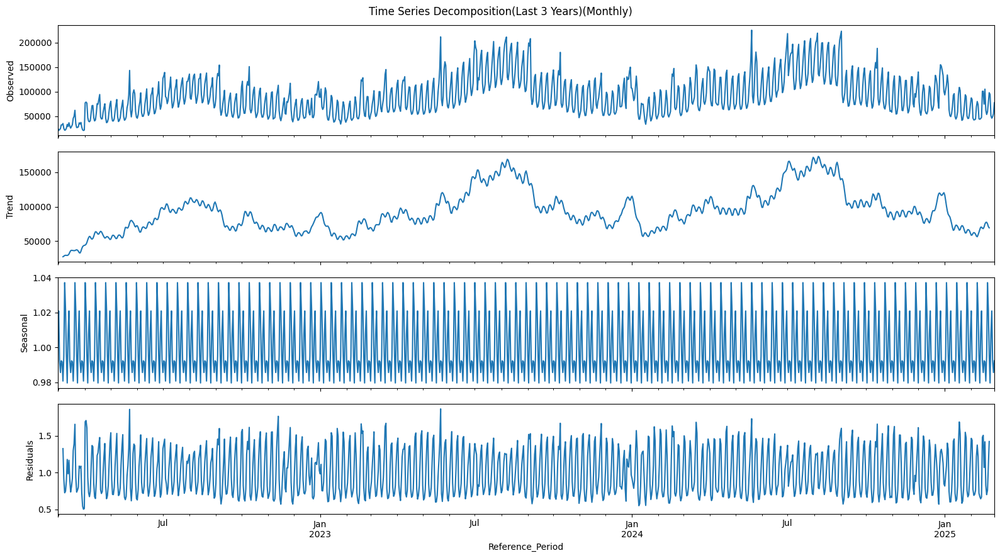

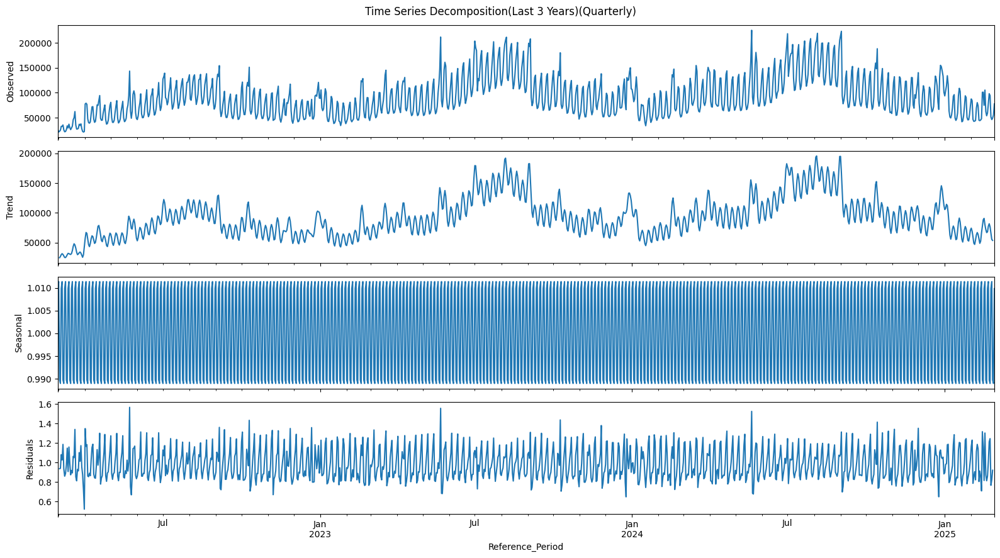

In [70]:
# Seasonal Decomposition for last 5 years (Multiplicative)
decomposition_5yr = {}

for name, period in periods.items():
  decomposition_5yr[name] = seasonal_decompose(last_five_years_data['Total'], model='multiplicative', period=period)

# Plotting the decomposed components
for name, decomposition in decomposition_5yr.items():
    fig, axes = plt.subplots(4, 1, sharex=True, figsize=(16, 9))
    decomposition.observed.plot(ax=axes[0], legend=False)
    axes[0].set_ylabel('Observed')
    decomposition.trend.plot(ax=axes[1], legend=False)
    axes[1].set_ylabel('Trend')
    decomposition.seasonal.plot(ax=axes[2], legend=False)
    axes[2].set_ylabel('Seasonal')
    decomposition.resid.plot(ax=axes[3], legend=False)
    axes[3].set_ylabel('Residuals')
    fig.suptitle(f'Time Series Decomposition(Last 5 Years)({name.capitalize()})')
    plt.tight_layout()
    plt.show()

# Seasonal Decomposition for last 3 years (Multiplicative)
decomposition_3yr = {}

for name, period in periods.items():
  decomposition_3yr[name] = seasonal_decompose(last_three_years_data['Total'], model='multiplicative', period=period)

# Plotting the decomposed components
for name, decomposition in decomposition_3yr.items():
    fig, axes = plt.subplots(4, 1, sharex=True, figsize=(16, 9))
    decomposition.observed.plot(ax=axes[0], legend=False)
    axes[0].set_ylabel('Observed')
    decomposition.trend.plot(ax=axes[1], legend=False)
    axes[1].set_ylabel('Trend')
    decomposition.seasonal.plot(ax=axes[2], legend=False)
    axes[2].set_ylabel('Seasonal')
    decomposition.resid.plot(ax=axes[3], legend=False)
    axes[3].set_ylabel('Residuals')
    fig.suptitle(f'Time Series Decomposition(Last 3 Years)({name.capitalize()})')
    plt.tight_layout()
    plt.show()

Compare additive and Multiplicative

What insights can businesses gain from these components? (E.g., does seasonality indicate predictable demand cycles?)

# Forecasting Models & Performance Evaluation

## Whole Dataset

In [71]:
# Apply differencing to the 'Total' column
vehicles_all = vehicles_entering.copy()
vehicles_all['Total_diff'] = vehicles_all['Total'].diff()
vehicles_all = vehicles_all.dropna()

# ADF Test on the differenced data
print("\nTotal Differenced")
adf_test(vehicles_all['Total_diff'])


Total Differenced
Results of Dickey-Fuller Test:
Test Statistic                -1.173827e+01
p-value                        1.291996e-21
#Lags Used                     2.800000e+01
Number of Observations Used    2.951000e+03
Critical Value (1%)           -3.432568e+00
Critical Value (5%)           -2.862520e+00
Critical Value (10%)          -2.567292e+00
dtype: float64


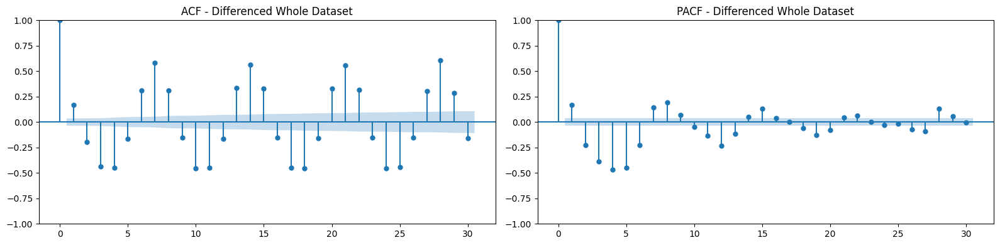

In [72]:
# ACF and PACF Plots for the differenced whole dataset
plot_acf_pacf(vehicles_all['Total_diff'], 'Differenced Whole Dataset')

In [87]:
# Split data to train and test
train_size = int(len(vehicles_entering) * 0.8)
train_data = vehicles_entering[:train_size]
test_data = vehicles_entering[train_size:]
print("\nTrain data")
print(len(train_data))
print(train_data.tail())
print("\nTest data")
print(len(test_data))
print(test_data.head())


Train data
2384
                 Reference_period   Total  Year  Month  Quarter  Week
Reference_Period                                                     
2023-07-08             2023-07-08  173805  2023      7        3    27
2023-07-09             2023-07-09  184406  2023      7        3    27
2023-07-10             2023-07-10  117519  2023      7        3    28
2023-07-11             2023-07-11   96664  2023      7        3    28
2023-07-12             2023-07-12  103022  2023      7        3    28

Test data
597
                 Reference_period   Total  Year  Month  Quarter  Week
Reference_Period                                                     
2023-07-13             2023-07-13  114909  2023      7        3    28
2023-07-14             2023-07-14  149537  2023      7        3    28
2023-07-15             2023-07-15  170729  2023      7        3    28
2023-07-16             2023-07-16  180229  2023      7        3    28
2023-07-17             2023-07-17  121147  2023      7    

### ARIMA

In [76]:
#ARIMA
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error
import math

def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

arima_predictions = {}
results = []

# ARIMA (1, 1, 1)
order = (1, 1, 1)
model = ARIMA(train_data['Total'], order=order)
model_fit = model.fit() # Call the fit() method to fit the model
predictions = model_fit.predict(start=len(train_data), end=len(vehicles_entering) - 1)
arima_predictions[f'ARIMA{order}'] = predictions
rmse = math.sqrt(mean_squared_error(test_data['Total'], predictions))
mae = mean_absolute_error(test_data['Total'], predictions)
mape = mean_absolute_percentage_error(test_data['Total'], predictions)
mse = mean_squared_error(test_data['Total'], predictions)
results.append([f'ARIMA{order}', rmse, mae, mape, mse])

# ARIMA (7, 1, 7)
order = (7, 1, 7)
model = ARIMA(train_data['Total'], order=order)
model_fit = model.fit() # Call the fit() method to fit the model
predictions = model_fit.predict(start=len(train_data), end=len(vehicles_entering) - 1)
arima_predictions[f'ARIMA{order}'] = predictions
rmse = math.sqrt(mean_squared_error(test_data['Total'], predictions))
mae = mean_absolute_error(test_data['Total'], predictions)
mape = mean_absolute_percentage_error(test_data['Total'], predictions)
mse = mean_squared_error(test_data['Total'], predictions)
results.append([f'ARIMA{order}', rmse, mae, mape, mse])

# Display results in a table
results_df = pd.DataFrame(results, columns=['Model', 'RMSE', 'MAE', 'MAPE', 'MSE'])
print(results_df)

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so infe

            Model          RMSE           MAE       MAPE           MSE
0  ARIMA(1, 1, 1)  46752.247868  39677.229123  51.759253  2.185773e+09
1  ARIMA(7, 1, 7)  43377.034635  37852.456643  48.824987  1.881567e+09


### Exponential Smoothing

In [77]:
# Exponential Smoothing
from statsmodels.tsa.holtwinters import SimpleExpSmoothing, ExponentialSmoothing

exp_smoothing_predictions = {}
results = []

methods = {
    'Simple Exponential Smoothing': SimpleExpSmoothing,
    'Holt\'s Linear Trend': lambda x: ExponentialSmoothing(x, trend='add'),
    'Holt-Winters Additive': lambda x: ExponentialSmoothing(x, trend='add', seasonal='add', seasonal_periods=7),
    'Holt-Winters Multiplicative': lambda x: ExponentialSmoothing(x, trend='add', seasonal='mul', seasonal_periods=7)
}

for name, method_func in methods.items():
    if name == 'Simple Exponential Smoothing':
        model = method_func(train_data['Total'])
        model_fit = model.fit()
    else:
        model = method_func(train_data['Total'])
        model_fit = model.fit(optimized=True)  # Use optimization for trend and seasonal methods

    predictions = model_fit.predict(start=len(train_data), end=len(vehicles_entering) - 1)
    exp_smoothing_predictions[name] = predictions
    rmse = math.sqrt(mean_squared_error(test_data['Total'], predictions))
    mae = mean_absolute_error(test_data['Total'], predictions)
    mape = mean_absolute_percentage_error(test_data['Total'], predictions)
    mse = mean_squared_error(test_data['Total'], predictions)
    results.append([name, rmse, mae, mape, mse])
    print(f"{name} fitted successfully.")

# Create a Pandas DataFrame from the results
results_df_exp = pd.DataFrame(results, columns=['Model', 'RMSE', 'MAE', 'MAPE', 'MSE'])
results_df = pd.concat([results_df, results_df_exp], ignore_index=True)
results_df

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



Simple Exponential Smoothing fitted successfully.
Holt's Linear Trend fitted successfully.


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



Holt-Winters Additive fitted successfully.
Holt-Winters Multiplicative fitted successfully.


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



,Model,RMSE,MAE,MAPE,MSE
0,"ARIMA(1, 1, 1)",46752.247868,39677.229123,51.759253,2.185773e+09
1,"ARIMA(7, 1, 7)",43377.034635,37852.456643,48.824987,1.881567e+09
2,Simple Exponential Smoothing,41620.791225,34038.106010,38.207100,1.732290e+09
3,Holt's Linear Trend,84712.992303,69885.537046,66.059316,7.176291e+09
4,Holt-Winters Additive,202276.404465,179080.919017,216.038726,4.091574e+10
5,Holt-Winters Multiplicative,257984.386658,221538.002877,249.598102,6.655594e+10


### Prophet

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp_madbb_o/ek344lgg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp_madbb_o/ixh000q1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85541', 'data', 'file=/tmp/tmp_madbb_o/ek344lgg.json', 'init=/tmp/tmp_madbb_o/ixh000q1.json', 'output', 'file=/tmp/tmp_madbb_o/prophet_modelzm18vev4/prophet_model-20250417145512.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:55:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:55:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


                          Model           RMSE            MAE        MAPE  \
0                ARIMA(1, 1, 1)   46752.247868   39677.229123   51.759253   
1                ARIMA(7, 1, 7)   43377.034635   37852.456643   48.824987   
2  Simple Exponential Smoothing   41620.791225   34038.106010   38.207100   
3           Holt's Linear Trend   84712.992303   69885.537046   66.059316   
4         Holt-Winters Additive  202276.404465  179080.919017  216.038726   
5   Holt-Winters Multiplicative  257984.386658  221538.002877  249.598102   
6                       Prophet   54068.650141   47232.190819   59.821518   

            MSE  
0  2.185773e+09  
1  1.881567e+09  
2  1.732290e+09  
3  7.176291e+09  
4  4.091574e+10  
5  6.655594e+10  
6  2.923419e+09  


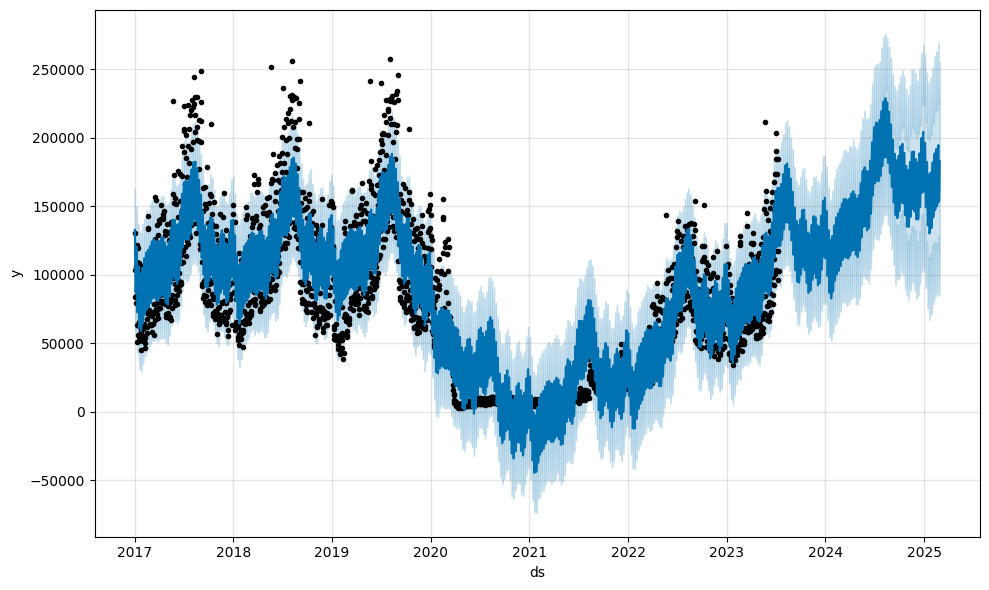

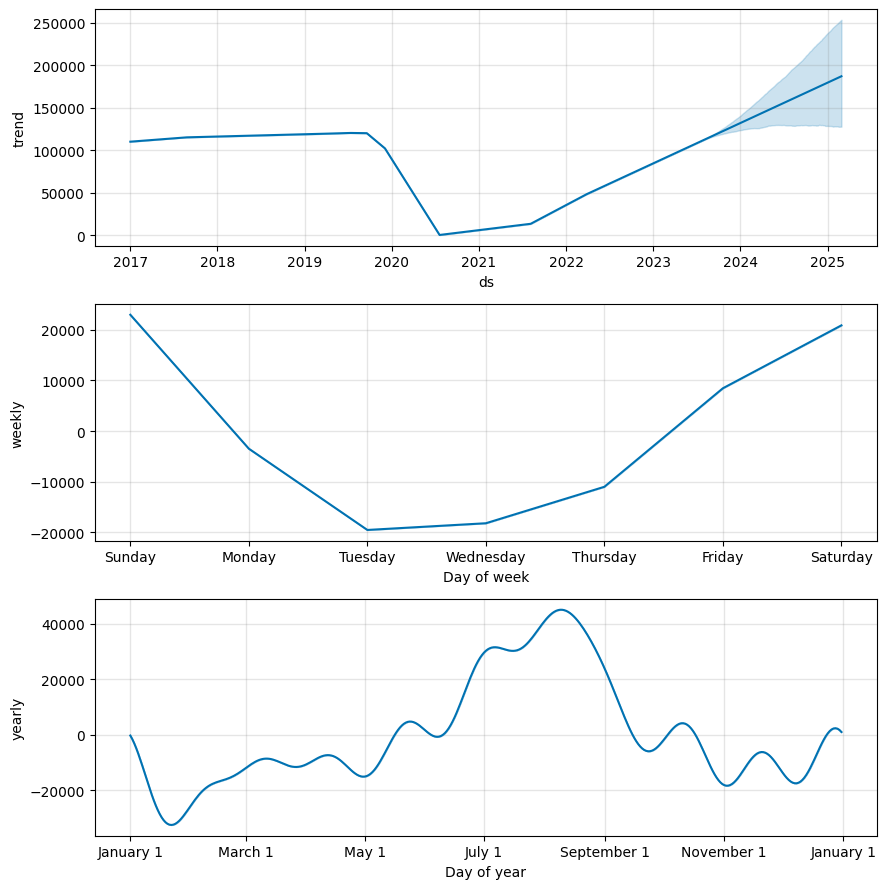

In [78]:
# Prophet
from prophet import Prophet

# Prepare data for Prophet
prophet_data = train_data[['Reference_period', 'Total']].rename(columns={'Reference_period': 'ds', 'Total': 'y'})

# Initialize and fit the Prophet model
model = Prophet()
model.fit(prophet_data)

# Create future dates for predictions
future = model.make_future_dataframe(periods=len(test_data), freq='D')

# Make predictions
forecast = model.predict(future)
prophet_predictions = forecast['yhat'][-len(test_data):].values

rmse = np.sqrt(mean_squared_error(test_data['Total'], forecast['yhat'][-len(test_data):]))
mae = mean_absolute_error(test_data['Total'], forecast['yhat'][-len(test_data):])
mape = mean_absolute_percentage_error(test_data['Total'], forecast['yhat'][-len(test_data):])
mse = mean_squared_error(test_data['Total'], forecast['yhat'][-len(test_data):])

# Append results to the results DataFrame
new_row = pd.DataFrame({'Model': ['Prophet'], 'RMSE': [rmse], 'MAE': [mae], 'MAPE': [mape], 'MSE': [mse]})
results_df = pd.concat([results_df, new_row], ignore_index=True)
print(results_df)

# Plot the forecast
fig1 = model.plot(forecast)
# Plot components
fig2 = model.plot_components(forecast)

### LSTM


In [80]:
# LSTM
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
data = vehicles_entering['Total'].values.reshape(-1, 1)
data_scaled = scaler.fit_transform(data)

# Split data into train and test
train_size = int(len(data_scaled) * 0.8)
train_lstm = data_scaled[:train_size]
test_lstm = data_scaled[train_size:]

# Function to create sequences for LSTM
def create_sequences(data, seq_length):
    xs = []
    ys = []
    for i in range(len(data)-seq_length):
        x = data[i:(i+seq_length)]
        y = data[i+seq_length]
        xs.append(x)
        ys.append(y)
    return np.array(xs), np.array(ys)

seq_length = 7  # Weekly
X_train, y_train = create_sequences(train_lstm, seq_length)
X_test, y_test = create_sequences(test_lstm, seq_length)

X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(seq_length, 1)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=1)

lstm_predictions_scaled = model.predict(X_test)
lstm_predictions = scaler.inverse_transform(lstm_predictions_scaled)

# Store the predictions for later use
all_lstm_predictions = np.empty_like(vehicles_entering['Total'].values, dtype=float)
all_lstm_predictions[:] = np.nan
all_lstm_predictions[train_size + seq_length:] = lstm_predictions.flatten() # Populate with prediction

rmse_lstm = np.sqrt(mean_squared_error(scaler.inverse_transform(y_test), lstm_predictions))
mae_lstm = mean_absolute_error(scaler.inverse_transform(y_test), lstm_predictions)
mape_lstm = mean_absolute_percentage_error(scaler.inverse_transform(y_test), lstm_predictions)
mse_lstm = mean_squared_error(scaler.inverse_transform(y_test), lstm_predictions)

# Append LSTM results to the results DataFrame
new_row = pd.DataFrame({'Model': ['LSTM'], 'RMSE': [rmse_lstm], 'MAE': [mae_lstm], 'MAPE': [mape_lstm], 'MSE': [mse_lstm]})
results_df = pd.concat([results_df, new_row], ignore_index=True)
results_df

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 0.0689
Epoch 2/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0111
Epoch 3/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0098
Epoch 4/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0082
Epoch 5/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0069
Epoch 6/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0061
Epoch 7/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0062
Epoch 8/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0050
Epoch 9/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0044
Epoch 10/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0054
Epoch 11/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0045
Epoch 12/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0044
Epoch 13/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0047
Epoch 14/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0048
Epoch 15/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0043
Epoch 16/50
75/75 ━

,Model,RMSE,MAE,MAPE,MSE
0,"ARIMA(1, 1, 1)",46752.247868,39677.229123,51.759253,2.185773e+09
1,"ARIMA(7, 1, 7)",43377.034635,37852.456643,48.824987,1.881567e+09
2,Simple Exponential Smoothing,41620.791225,34038.106010,38.207100,1.732290e+09
3,Holt's Linear Trend,84712.992303,69885.537046,66.059316,7.176291e+09
4,Holt-Winters Additive,202276.404465,179080.919017,216.038726,4.091574e+10
5,Holt-Winters Multiplicative,257984.386658,221538.002877,249.598102,6.655594e+10
6,Prophet,54068.650141,47232.190819,59.821518,2.923419e+09
7,LSTM,17886.248979,11597.850430,12.252786,3.199179e+08


### Results

In [81]:
results_df = results_df.sort_values(by='RMSE', ascending=True)
results_df

,Model,RMSE,MAE,MAPE,MSE
7,LSTM,17886.248979,11597.850430,12.252786,3.199179e+08
2,Simple Exponential Smoothing,41620.791225,34038.106010,38.207100,1.732290e+09
1,"ARIMA(7, 1, 7)",43377.034635,37852.456643,48.824987,1.881567e+09
0,"ARIMA(1, 1, 1)",46752.247868,39677.229123,51.759253,2.185773e+09
6,Prophet,54068.650141,47232.190819,59.821518,2.923419e+09
3,Holt's Linear Trend,84712.992303,69885.537046,66.059316,7.176291e+09
4,Holt-Winters Additive,202276.404465,179080.919017,216.038726,4.091574e+10
5,Holt-Winters Multiplicative,257984.386658,221538.002877,249.598102,6.655594e+10


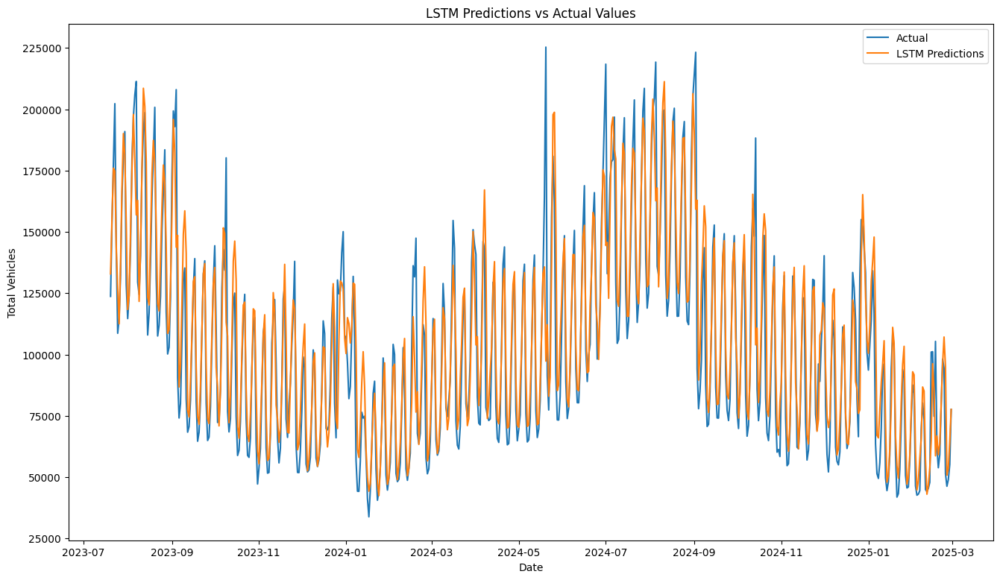

In [95]:
# Plotting LSTM predictions
plt.figure(figsize=(16, 9))
# Adjust the indexing for the 'Total' column
plt.plot(test_data['Reference_period'][seq_length:], test_data['Total'][seq_length:], label='Actual')
plt.plot(test_data['Reference_period'][seq_length:], all_lstm_predictions[train_size + seq_length:], label='LSTM Predictions')
plt.legend()
plt.xlabel('Date')
plt.ylabel('Total Vehicles')
plt.title('LSTM Predictions vs Actual Values')
plt.show()

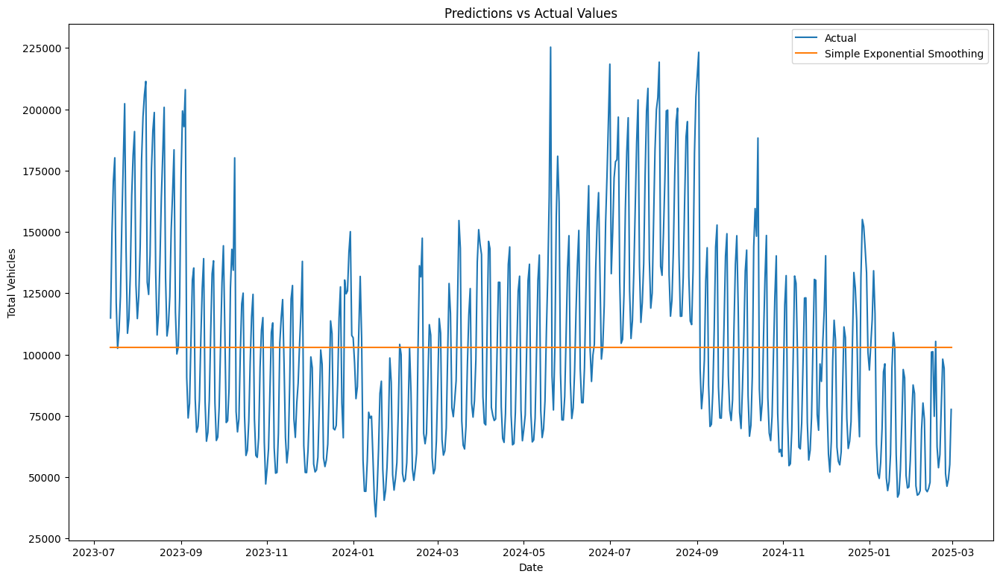

In [94]:
#Plotting Simple Exponential Predictions
plt.figure(figsize=(16, 9))
plt.plot(test_data['Reference_period'], test_data['Total'], label='Actual')
plt.plot(test_data['Reference_period'], exp_smoothing_predictions['Simple Exponential Smoothing'], label='Simple Exponential Smoothing')
plt.legend()
plt.xlabel('Date')
plt.ylabel('Total Vehicles')
plt.title('Predictions vs Actual Values')
plt.show()

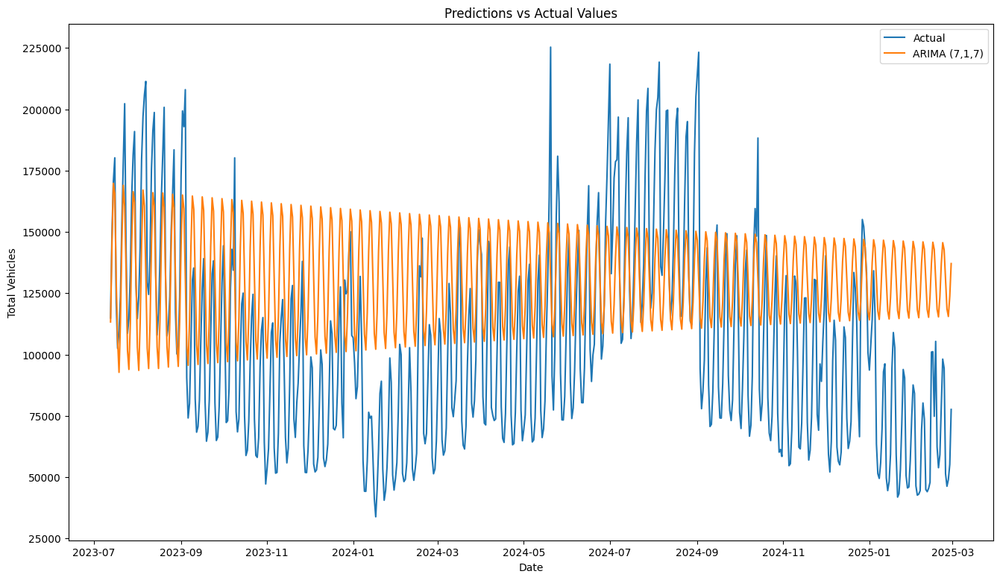

In [96]:
#Plotting ARIMA (7, 1, 7)
plt.figure(figsize=(16, 9))
plt.plot(test_data['Reference_period'], test_data['Total'], label='Actual')
plt.plot(test_data['Reference_period'], arima_predictions['ARIMA(7, 1, 7)'], label='ARIMA (7,1,7)')
plt.legend()
plt.xlabel('Date')
plt.ylabel('Total Vehicles')
plt.title('Predictions vs Actual Values')
plt.show()

**We compared our models and found that LSTM weekly works best for long and stort term forecasting.**

The model would depend on industry and data available for forecasting.

## Last 3 Years

In [97]:
# Last 3 train and test
train_size_3yr = int(len(last_three_years_data) * 0.8)
train_data_3yr = last_three_years_data[:train_size_3yr]
test_data_3yr = last_three_years_data[train_size_3yr:]

print("\nLast Three Years Train Data:")
print(len(train_data_3yr))
print(train_data_3yr.tail())
print("\nLast Three Years Test Data:")
print(len(test_data_3yr))
print(test_data_3yr.head())


Last Three Years Train Data:
877
                 Reference_period   Total  Year  Month  Quarter  Week
Reference_Period                                                     
2024-07-19             2024-07-19  160928  2024      7        3    29
2024-07-20             2024-07-20  186533  2024      7        3    29
2024-07-21             2024-07-21  203826  2024      7        3    29
2024-07-22             2024-07-22  135965  2024      7        3    30
2024-07-23             2024-07-23  113115  2024      7        3    30

Last Three Years Test Data:
220
                 Reference_period   Total  Year  Month  Quarter  Week
Reference_Period                                                     
2024-07-24             2024-07-24  121238  2024      7        3    30
2024-07-25             2024-07-25  137057  2024      7        3    30
2024-07-26             2024-07-26  173306  2024      7        3    30
2024-07-27             2024-07-27  199337  2024      7        3    30
2024-07-28             

### ARIMA

In [100]:
#ARIMA for the last 3 years

arima_predictions_3yr = {}
results_3yr = []

# ARIMA (1, 0, 1) for last 3 years
order_3yr = (1, 0, 1)
model_3yr = ARIMA(train_data_3yr['Total'], order=order_3yr)
model_fit_3yr = model_3yr.fit()
predictions_3yr = model_fit_3yr.predict(start=len(train_data_3yr), end=len(last_three_years_data) - 1)
arima_predictions_3yr[f'ARIMA{order_3yr}'] = predictions_3yr
rmse_3yr = math.sqrt(mean_squared_error(test_data_3yr['Total'], predictions_3yr))
mae_3yr = mean_absolute_error(test_data_3yr['Total'], predictions_3yr)
mape_3yr = np.mean(np.abs((test_data_3yr['Total'] - predictions_3yr) / test_data_3yr['Total'])) * 100
mse_3yr = mean_squared_error(test_data_3yr['Total'], predictions_3yr)
results_3yr.append([f'ARIMA{order_3yr}', rmse_3yr, mae_3yr, mape_3yr, mse_3yr])

# ARIMA (7, 0, 7) for last 3 years
order_3yr = (7, 0, 7)
model_3yr = ARIMA(train_data_3yr['Total'], order=order_3yr)
model_fit_3yr = model_3yr.fit()
predictions_3yr = model_fit_3yr.predict(start=len(train_data_3yr), end=len(last_three_years_data) - 1)
arima_predictions_3yr[f'ARIMA{order_3yr}'] = predictions_3yr
rmse_3yr = math.sqrt(mean_squared_error(test_data_3yr['Total'], predictions_3yr))
mae_3yr = mean_absolute_error(test_data_3yr['Total'], predictions_3yr)
mape_3yr = np.mean(np.abs((test_data_3yr['Total'] - predictions_3yr) / test_data_3yr['Total'])) * 100
mse_3yr = mean_squared_error(test_data_3yr['Total'], predictions_3yr)
results_3yr.append([f'ARIMA{order_3yr}', rmse_3yr, mae_3yr, mape_3yr, mse_3yr])

# Display results in a table for the last 3 years
results_df_3yr = pd.DataFrame(results_3yr, columns=['Model', 'RMSE', 'MAE', 'MAPE', 'MSE'])
print("\nARIMA Results for the Last 3 Years:")
print(results_df_3yr)

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so infe


ARIMA Results for the Last 3 Years:
            Model          RMSE           MAE       MAPE           MSE
0  ARIMA(1, 0, 1)  44476.696177  34675.330294  35.502544  1.978177e+09
1  ARIMA(7, 0, 7)  54179.110903  48357.105625  63.572275  2.935376e+09


### Exponential Smoothing

In [101]:
# Exponential Smoothing for the last 3 years
exp_smoothing_predictions_3yr = {}
results_3yr = []

methods = {
    'Simple Exponential Smoothing': SimpleExpSmoothing,
    'Holt\'s Linear Trend': lambda x: ExponentialSmoothing(x, trend='add'),
    'Holt-Winters Additive': lambda x: ExponentialSmoothing(x, trend='add', seasonal='add', seasonal_periods=7),
    'Holt-Winters Multiplicative': lambda x: ExponentialSmoothing(x, trend='add', seasonal='mul', seasonal_periods=7)
}

for name, method_func in methods.items():
    if name == 'Simple Exponential Smoothing':
        model = method_func(train_data_3yr['Total'])
        model_fit = model.fit()
    else:
        model = method_func(train_data_3yr['Total'])
        model_fit = model.fit(optimized=True)  # Use optimization for trend and seasonal methods

    predictions = model_fit.predict(start=len(train_data_3yr), end=len(last_three_years_data) - 1)
    exp_smoothing_predictions_3yr[name] = predictions
    rmse = math.sqrt(mean_squared_error(test_data_3yr['Total'], predictions))
    mae = mean_absolute_error(test_data_3yr['Total'], predictions)
    mape = np.mean(np.abs((test_data_3yr['Total'] - predictions) / test_data_3yr['Total'])) * 100
    mse = mean_squared_error(test_data_3yr['Total'], predictions)
    results_3yr.append([name, rmse, mae, mape, mse])

# Create a Pandas DataFrame from the results for the last 3 years
results_df_3yr_exp = pd.DataFrame(results_3yr, columns=['Model', 'RMSE', 'MAE', 'MAPE', 'MSE'])
results_df_3yr = pd.concat([results_df_3yr, results_df_3yr_exp], ignore_index=True)
results_df_3yr

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.

/usr/local/lib/p

,Model,RMSE,MAE,MAPE,MSE
0,"ARIMA(1, 0, 1)",44476.696177,34675.330294,35.502544,1.978177e+09
1,"ARIMA(7, 0, 7)",54179.110903,48357.105625,63.572275,2.935376e+09
2,Simple Exponential Smoothing,44327.923777,37251.390379,47.153215,1.964965e+09
3,Holt's Linear Trend,50715.522260,43057.777468,57.057080,2.572064e+09
4,Holt-Winters Additive,69560.544337,61508.609692,81.140521,4.838669e+09
5,Holt-Winters Multiplicative,74445.160762,64545.601732,81.808445,5.542082e+09


### Prophet

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp_madbb_o/sn052w43.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp_madbb_o/cnof0l14.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67441', 'data', 'file=/tmp/tmp_madbb_o/sn052w43.json', 'init=/tmp/tmp_madbb_o/cnof0l14.json', 'output', 'file=/tmp/tmp_madbb_o/prophet_modelb2w6f6ux/prophet_model-20250417153555.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:35:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:35:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


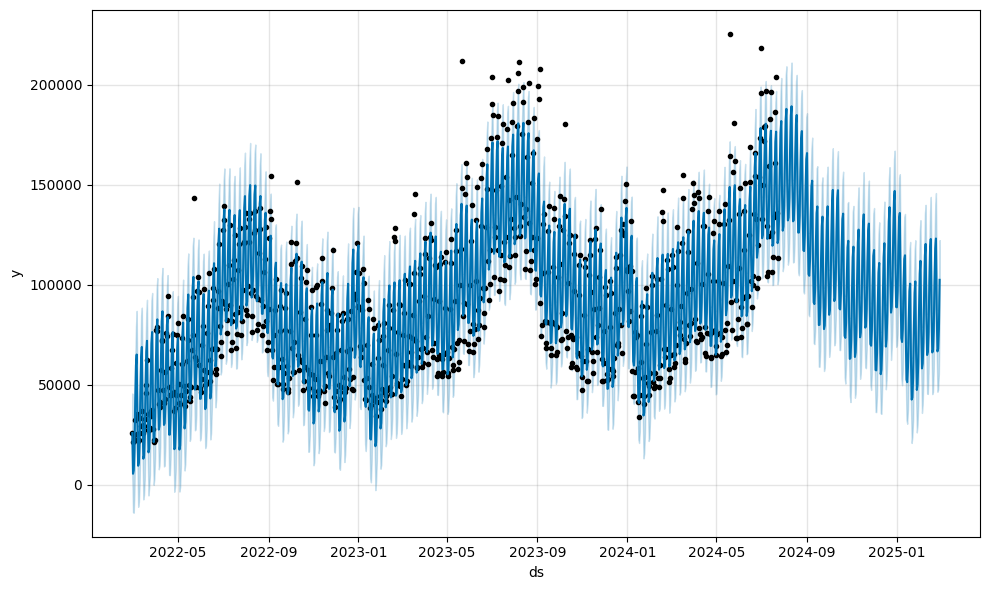

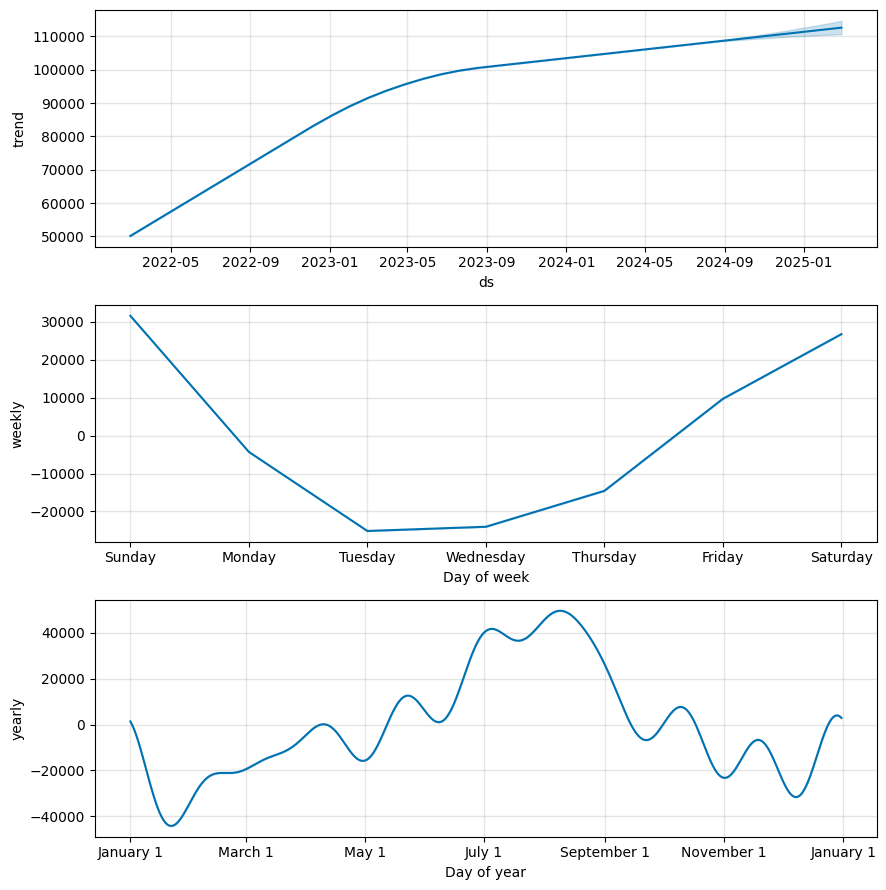

In [102]:
# Prophet for the last 3 years

# Prepare data for Prophet
prophet_data_3yr = train_data_3yr[['Reference_period', 'Total']].rename(columns={'Reference_period': 'ds', 'Total': 'y'})

# Initialize and fit the Prophet model
model_3yr = Prophet()
model_3yr.fit(prophet_data_3yr)

# Create future dates for predictions
future_3yr = model_3yr.make_future_dataframe(periods=len(test_data_3yr), freq='D')

# Make predictions
forecast_3yr = model_3yr.predict(future_3yr)
prophet_predictions_3yr = forecast_3yr['yhat'][-len(test_data_3yr):].values

rmse_3yr = np.sqrt(mean_squared_error(test_data_3yr['Total'], forecast_3yr['yhat'][-len(test_data_3yr):]))
mae_3yr = mean_absolute_error(test_data_3yr['Total'], forecast_3yr['yhat'][-len(test_data_3yr):])
mape_3yr = mean_absolute_percentage_error(test_data_3yr['Total'], forecast_3yr['yhat'][-len(test_data_3yr):])
mse_3yr = mean_squared_error(test_data_3yr['Total'], forecast_3yr['yhat'][-len(test_data_3yr):])

# Append results to the results DataFrame for the last 3 years
new_row_3yr = pd.DataFrame({'Model': ['Prophet'], 'RMSE': [rmse_3yr], 'MAE': [mae_3yr], 'MAPE': [mape_3yr], 'MSE': [mse_3yr]})
results_df_3yr = pd.concat([results_df_3yr, new_row_3yr], ignore_index=True)
print(results_df_3yr)

# Store Prophet predictions for the last 3 years
prophet_predictions_dict_3yr = {'Prophet': pd.Series(prophet_predictions_3yr, index=test_data_3yr.index)}

# Plot the forecast
fig1_3yr = model_3yr.plot(forecast_3yr)
# Plot components
fig2_3yr = model_3yr.plot_components(forecast_3yr)

In [103]:
results_df_3yr

,Model,RMSE,MAE,MAPE,MSE
0,"ARIMA(1, 0, 1)",44476.696177,34675.330294,35.502544,1.978177e+09
1,"ARIMA(7, 0, 7)",54179.110903,48357.105625,63.572275,2.935376e+09
2,Simple Exponential Smoothing,44327.923777,37251.390379,47.153215,1.964965e+09
3,Holt's Linear Trend,50715.522260,43057.777468,57.057080,2.572064e+09
4,Holt-Winters Additive,69560.544337,61508.609692,81.140521,4.838669e+09
5,Holt-Winters Multiplicative,74445.160762,64545.601732,81.808445,5.542082e+09
6,Prophet,18774.631366,13897.425130,15.919932,3.524868e+08


### LSTM

In [104]:
# LSTM

scaler_3yr_lstm = MinMaxScaler()
data_3yr_lstm = last_three_years_data['Total'].values.reshape(-1, 1)
data_scaled_3yr_lstm = scaler_3yr_lstm.fit_transform(data_3yr_lstm)

# Split data into train and test for the last 3 years
train_size_3yr_lstm = int(len(data_scaled_3yr_lstm) * 0.8)
train_lstm_3yr = data_scaled_3yr_lstm[:train_size_3yr_lstm]
test_lstm_3yr = data_scaled_3yr_lstm[train_size_3yr_lstm:]

# Function to create sequences for LSTM
def create_sequences_3yr(data, seq_length):
    xs = []
    ys = []
    for i in range(len(data)-seq_length):
        x = data[i:(i+seq_length)]
        y = data[i+seq_length]
        xs.append(x)
        ys.append(y)
    return np.array(xs), np.array(ys)

seq_length_3yr_lstm = 7  # Weekly
X_train_3yr_lstm, y_train_3yr_lstm = create_sequences_3yr(train_lstm_3yr, seq_length_3yr_lstm)
X_test_3yr_lstm, y_test_3yr_lstm = create_sequences_3yr(test_lstm_3yr, seq_length_3yr_lstm)

X_train_3yr_lstm = np.reshape(X_train_3yr_lstm, (X_train_3yr_lstm.shape[0], X_train_3yr_lstm.shape[1], 1))
X_test_3yr_lstm = np.reshape(X_test_3yr_lstm, (X_test_3yr_lstm.shape[0], X_test_3yr_lstm.shape[1], 1))

model_3yr_lstm = Sequential()
model_3yr_lstm.add(LSTM(50, activation='relu', input_shape=(seq_length_3yr_lstm, 1)))
model_3yr_lstm.add(Dense(1))
model_3yr_lstm.compile(optimizer='adam', loss='mse')

model_3yr_lstm.fit(X_train_3yr_lstm, y_train_3yr_lstm, epochs=50, batch_size=32, verbose=0) # Reduced verbosity

lstm_predictions_scaled_3yr = model_3yr_lstm.predict(X_test_3yr_lstm)
lstm_predictions_3yr = scaler_3yr_lstm.inverse_transform(lstm_predictions_scaled_3yr)
y_test_original_3yr = scaler_3yr_lstm.inverse_transform(y_test_3yr_lstm.reshape(-1, 1))

# Store the predictions for later use for the last 3 years
all_lstm_predictions_3yr = np.empty_like(last_three_years_data['Total'].values, dtype=float)
all_lstm_predictions_3yr[:] = np.nan
all_lstm_predictions_3yr[train_size_3yr_lstm + seq_length_3yr_lstm:] = lstm_predictions_3yr.flatten() # Populate with prediction

rmse_lstm_3yr = np.sqrt(mean_squared_error(y_test_original_3yr, lstm_predictions_3yr))
mae_lstm_3yr = mean_absolute_error(y_test_original_3yr, lstm_predictions_3yr)
mape_lstm_3yr = mean_absolute_percentage_error(y_test_original_3yr, lstm_predictions_3yr)
mse_lstm_3yr = mean_squared_error(y_test_original_3yr, lstm_predictions_3yr)

# Append LSTM results to the results DataFrame for the last 3 years
new_row_3yr = pd.DataFrame({'Model': ['LSTM'], 'RMSE': [rmse_lstm_3yr], 'MAE': [mae_lstm_3yr], 'MAPE': [mape_lstm_3yr], 'MSE': [mse_lstm_3yr]})
results_df_3yr = pd.concat([results_df_3yr, new_row_3yr], ignore_index=True)

# Store LSTM predictions in the 'all_predictions_3yr' dictionary
if 'all_predictions_3yr' not in locals():
    all_predictions_3yr = {}
start_index_lstm_3yr = last_three_years_data.index[train_size_3yr_lstm + seq_length_3yr_lstm]
prediction_index_lstm_3yr = pd.date_range(start=start_index_lstm_3yr, periods=len(lstm_predictions_3yr), freq='D') # Assuming daily frequency
all_predictions_3yr['LSTM'] = pd.Series(lstm_predictions_3yr.flatten(), index=prediction_index_lstm_3yr)

print(results_df_3yr)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step
                          Model          RMSE           MAE       MAPE  \
0                ARIMA(1, 0, 1)  44476.696177  34675.330294  35.502544   
1                ARIMA(7, 0, 7)  54179.110903  48357.105625  63.572275   
2  Simple Exponential Smoothing  44327.923777  37251.390379  47.153215   
3           Holt's Linear Trend  50715.522260  43057.777468  57.057080   
4         Holt-Winters Additive  69560.544337  61508.609692  81.140521   
5   Holt-Winters Multiplicative  74445.160762  64545.601732  81.808445   
6                       Prophet  18774.631366  13897.425130  15.919932   
7                          LSTM  18922.152012  12014.517679  12.513762   

            MSE  
0  1.978177e+09  
1  2.935376e+09  
2  1.964965e+09  
3  2.572064e+09  
4  4.838669e+09  
5  5.542082e+09  
6  3.524868e+08  
7  3.580478e+08  


### Results

In [106]:
results_df_3yr = results_df_3yr.sort_values(by='RMSE', ascending=True)
results_df_3yr

,Model,RMSE,MAE,MAPE,MSE
6,Prophet,18774.631366,13897.425130,15.919932,3.524868e+08
7,LSTM,18922.152012,12014.517679,12.513762,3.580478e+08
2,Simple Exponential Smoothing,44327.923777,37251.390379,47.153215,1.964965e+09
0,"ARIMA(1, 0, 1)",44476.696177,34675.330294,35.502544,1.978177e+09
3,Holt's Linear Trend,50715.522260,43057.777468,57.057080,2.572064e+09
1,"ARIMA(7, 0, 7)",54179.110903,48357.105625,63.572275,2.935376e+09
4,Holt-Winters Additive,69560.544337,61508.609692,81.140521,4.838669e+09
5,Holt-Winters Multiplicative,74445.160762,64545.601732,81.808445,5.542082e+09


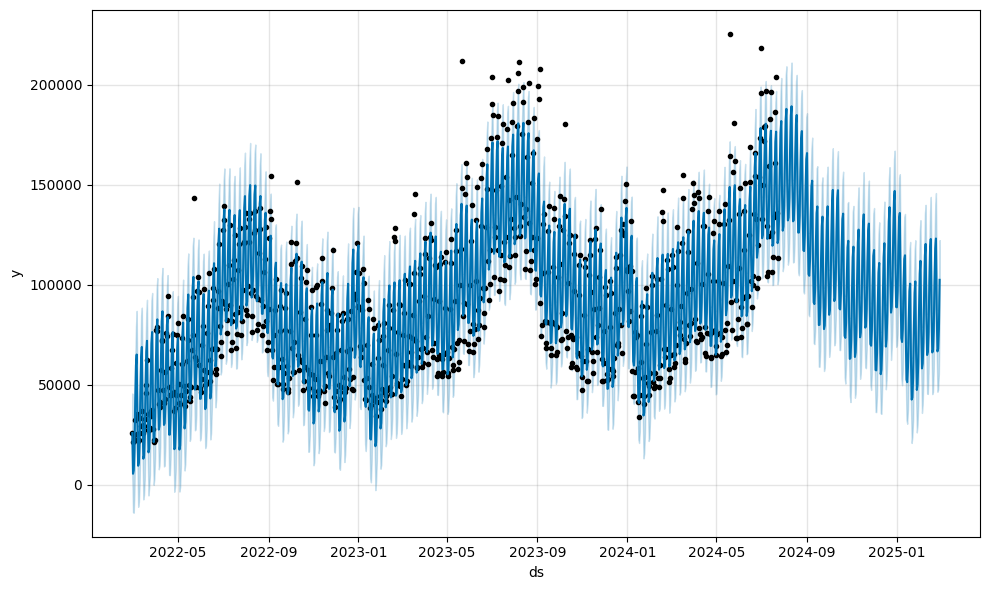

In [107]:
# Forecast of Prophet
fig1_3yr = model_3yr.plot(forecast_3yr)

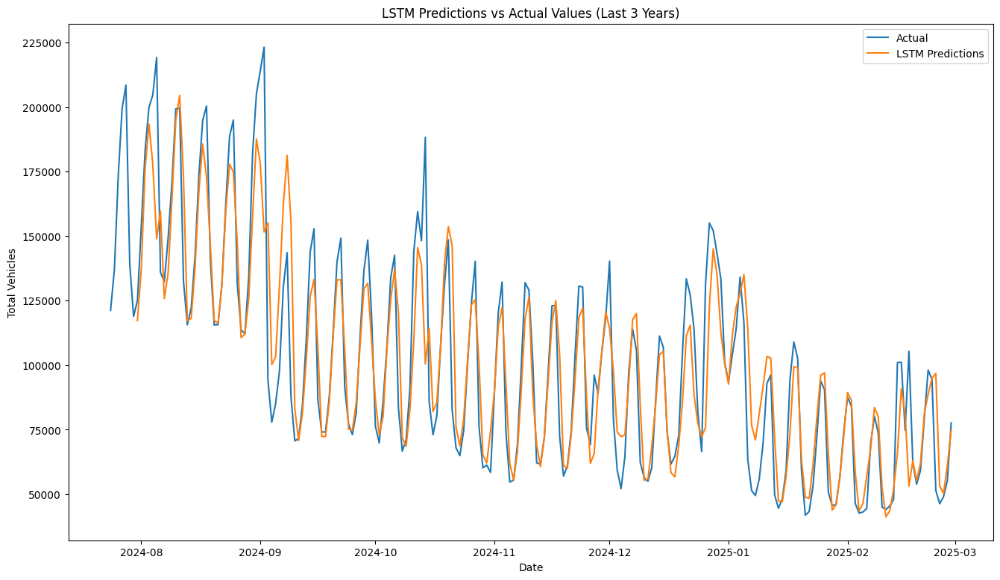

In [109]:
# Plotting LSTM predictions for the last 3 years
plt.figure(figsize=(16, 9))

# Adjust indexing based on the 3-year data and sequence length
start_index_plot_lstm_3yr = test_data_3yr.index[seq_length_3yr_lstm]
end_index_plot_lstm_3yr = test_data_3yr.index[-1]

lstm_predictions_plot_3yr = all_predictions_3yr['LSTM']

# Ensure the prediction series aligns with the test data index
intersection_index_lstm_3yr = test_data_3yr.index.intersection(lstm_predictions_plot_3yr.index)

plt.plot(test_data_3yr['Reference_period'], test_data_3yr['Total'], label='Actual')
plt.plot(intersection_index_lstm_3yr, lstm_predictions_plot_3yr[intersection_index_lstm_3yr], label='LSTM Predictions')

plt.legend()
plt.xlabel('Date')
plt.ylabel('Total Vehicles')
plt.title('LSTM Predictions vs Actual Values (Last 3 Years)')
plt.show()

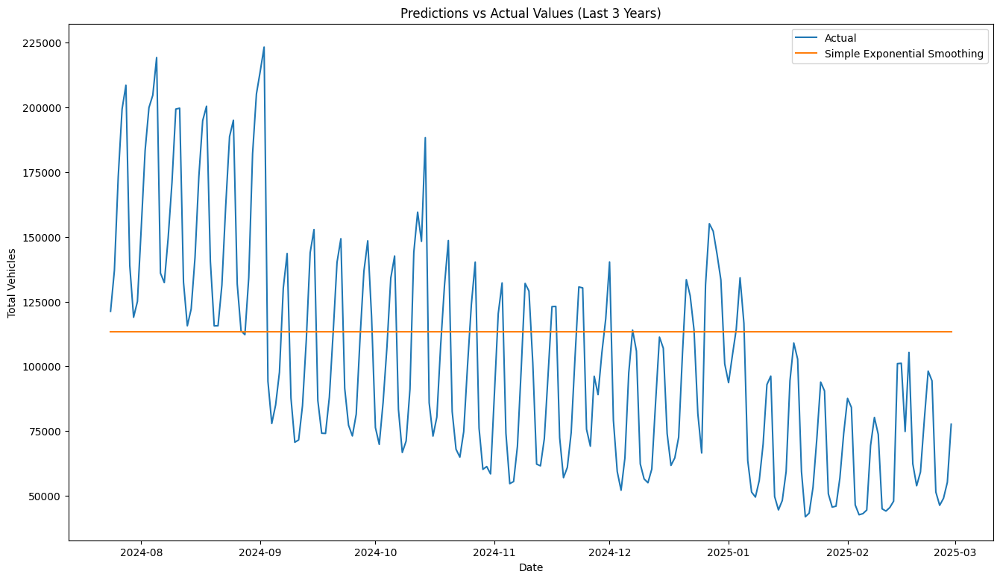

In [108]:
# Plotting Simple Exponential Predictions for the last 3 years
plt.figure(figsize=(16, 9))
plt.plot(test_data_3yr['Reference_period'], test_data_3yr['Total'], label='Actual')
plt.plot(test_data_3yr['Reference_period'], exp_smoothing_predictions_3yr['Simple Exponential Smoothing'], label='Simple Exponential Smoothing')
plt.legend()
plt.xlabel('Date')
plt.ylabel('Total Vehicles')
plt.title('Predictions vs Actual Values (Last 3 Years)')
plt.show()

For 3 year dataset, Prophet perfoms better

## Overall Analysis and Conclusion

